#### Econ-430 Project 2
#### By: Omer A.| George M.| Connor O. | Achmed R.
#### Instructor: Dr. Rojas
#### Due Date: Nov 22, 2023

#### Project description
This project seeks to understand how crime rate changes given factors such as location, police per capita, probability of conviction, and wages to name a few. The project will focus on applying meaningful statistical methods to the crime data for specific counties in North Carolina from the years 1981 to 1987. Our goal is to ultimately find out the most appropriate variables that contributed to the crime rate in the specific counties. The source of our data is wooldridge. http://fmwww.bc.edu/ec-p/data/wooldridge/crime4.des

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
import numpy as np
import wooldridge as woo
import seaborn as sns
# Load Modules and Functions
import statsmodels.api as sm
import statsmodels as sms
import seaborn as sns
import statsmodels.formula.api as smf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import wooldridge as woo

# Load Modules and Functions
from sklearn.linear_model import LinearRegression
from RegscorePy import mallow
import statsmodels.stats.api as sms
from simple_colors import *
import statsmodels.api as sm
import statsmodels as sms
import seaborn as sns
import statsmodels.formula.api as smf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy as sp
from RegscorePy import *
import scipy.stats as stats 
import scipy.stats as stats
import wooldridge as woo
from sklearn.ensemble import RandomForestRegressor
from RegscorePy import mallow
from fitter import Fitter
from ydata_profiling import ProfileReport
from statsmodels.stats.outliers_influence import variance_inflation_factor
from BorutaShap import BorutaShap

In [2]:
crime4 = woo.data('crime4')
crime4.describe()

,county,year,crmrte,prbarr,prbconv,prbpris,avgsen,polpc,density,taxpc,...,lpctymle,lpctmin,clcrmrte,clprbarr,clprbcon,clprbpri,clavgsen,clpolpc,cltaxpc,clmix
count,630.00000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,...,630.000000,630.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000
mean,100.60000,84.000000,0.031588,0.307368,0.688618,0.425518,8.954540,0.001917,1.386062,30.239194,...,-2.443015,2.913361,0.001998,-0.002022,-0.002620,-0.009420,-0.014085,0.012924,0.077298,-0.003677
std,58.03627,2.001589,0.018121,0.171205,1.690345,0.087245,2.658082,0.002735,1.439703,11.454694,...,0.196784,0.954615,0.202932,0.274909,0.483667,0.275722,0.322258,0.270235,0.168389,0.494354
min,1.00000,81.000000,0.001812,0.058823,0.068376,0.148936,4.220000,0.000459,0.197719,14.302565,...,-2.778080,0.249708,-1.650111,-1.580454,-3.045578,-1.235608,-1.278839,-3.131716,-0.708961,-2.906901
25%,51.00000,82.000000,0.018352,0.217902,0.347692,0.374403,7.160000,0.001191,0.532944,23.425596,...,-2.543456,2.303045,-0.090750,-0.108289,-0.163198,-0.140090,-0.202120,-0.024279,0.027234,-0.163001
50%,103.00000,84.000000,0.028441,0.278240,0.474375,0.428571,8.495000,0.001451,0.952595,27.792328,...,-2.486930,3.212684,0.002441,-0.010831,0.011686,-0.018636,-0.015911,0.013321,0.073614,0.001473
75%,151.00000,86.000000,0.038406,0.352518,0.635597,0.483189,10.197500,0.001803,1.507818,33.271218,...,-2.416943,3.643437,0.091439,0.109560,0.182517,0.111684,0.174592,0.059895,0.124873,0.188985
max,197.00000,87.000000,0.163835,2.750000,37.000000,0.678571,25.830000,0.035578,8.827652,119.761452,...,-1.293320,4.164309,1.221304,1.234696,2.195635,1.131048,1.207793,2.423420,0.932217,2.728670


In [4]:
crime4.head()

,county,year,crmrte,prbarr,prbconv,prbpris,avgsen,polpc,density,taxpc,...,lpctymle,lpctmin,clcrmrte,clprbarr,clprbcon,clprbpri,clavgsen,clpolpc,cltaxpc,clmix
0,1,81,0.039885,0.289696,0.402062,0.472222,5.61,0.001787,2.307159,25.697630,...,-2.433870,3.006608,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,82,0.038345,0.338111,0.433005,0.506993,5.59,0.001767,2.330254,24.874252,...,-2.449038,3.006608,-0.039376,0.154542,0.074143,0.071048,-0.003571,-0.011364,-0.032565,0.030857
2,1,83,0.030305,0.330449,0.525703,0.479705,5.80,0.001836,2.341801,26.451443,...,-2.464036,3.006608,-0.235316,-0.022922,0.193987,-0.055326,0.036879,0.038413,0.061477,-0.244732
3,1,84,0.034726,0.362525,0.604706,0.520104,6.89,0.001886,2.346420,26.842348,...,-2.478925,3.006608,0.136180,0.092641,0.140006,0.080857,0.172213,0.026930,0.014670,-0.027331
4,1,85,0.036573,0.325395,0.578723,0.497059,6.55,0.001924,2.364896,28.140337,...,-2.497306,3.006608,0.051825,-0.108054,-0.043918,-0.045320,-0.050606,0.020199,0.047223,0.172125


In [5]:
crime4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 630 entries, 0 to 629
Data columns (total 59 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   county    630 non-null    int64  
 1   year      630 non-null    int64  
 2   crmrte    630 non-null    float64
 3   prbarr    630 non-null    float64
 4   prbconv   630 non-null    float64
 5   prbpris   630 non-null    float64
 6   avgsen    630 non-null    float64
 7   polpc     630 non-null    float64
 8   density   630 non-null    float64
 9   taxpc     630 non-null    float64
 10  west      630 non-null    int64  
 11  central   630 non-null    int64  
 12  urban     630 non-null    int64  
 13  pctmin80  630 non-null    float64
 14  wcon      630 non-null    float64
 15  wtuc      630 non-null    float64
 16  wtrd      630 non-null    float64
 17  wfir      630 non-null    float64
 18  wser      630 non-null    float64
 19  wmfg      630 non-null    float64
 20  wfed      630 non-null    float6

## (a) Using the Boruta Algorithm identify the top 5-10 quantitative predictors (could be fewer 5 depending on your finding).

In [6]:
boruta_data = crime4[['crmrte', 'lprbarr', 'lprbconv', 'lprbpris', 'lavgsen','lpolpc',
               'ltaxpc','lwcon','lwtuc','lwtrd','lwfir','lwser','lwmfg','lwfed',
                'lwsta','lwloc']].copy()
boruta_data.head()

,crmrte,lprbarr,lprbconv,lprbpris,lavgsen,lpolpc,ltaxpc,lwcon,lwtuc,lwtrd,lwfir,lwser,lwmfg,lwfed,lwsta,lwloc
0,0.039885,-1.238923,-0.911149,-0.750306,1.724551,-6.327340,3.246399,5.330205,5.810005,5.205835,5.607452,5.374044,5.434246,6.014619,5.464848,5.444450
1,0.038345,-1.084381,-0.837006,-0.679258,1.720979,-6.338704,3.213833,5.360137,5.911600,5.244607,5.706707,5.444911,5.482013,6.039540,5.536862,5.467174
2,0.030305,-1.107303,-0.643019,-0.734584,1.757858,-6.300291,3.275311,5.392628,7.240509,5.281372,5.736475,5.481292,5.597310,6.084157,5.522900,5.515765
3,0.034726,-1.014662,-0.503013,-0.653727,1.930071,-6.273361,3.289981,5.409070,5.988612,5.301128,5.858180,5.531204,5.640985,6.129421,5.568077,5.577387
4,0.036573,-1.122715,-0.546931,-0.699047,1.879465,-6.253162,3.337204,5.496169,5.882718,5.332152,5.948220,5.564850,5.700042,6.195282,5.639919,5.664972


We Will be regressing on the crimerate variable and using the log of various metrics that were given in this dataset to make a linear log model with interaction variables. We went with the log variables of wages and other metrics because we felt that the large base values of the wage metrics would cause our model to be more innacurate in terms of its standard errors. This change helps with interpretability as well as keeping the standard errors smaller. 

  0%|          | 0/100 [00:00<?, ?it/s]

8 attributes confirmed important: ['lprbarr', 'lprbconv', 'lwfed', 'lwtrd', 'lwmfg', 'lwsta', 'lwtuc', 'lpolpc']
7 attributes confirmed unimportant: ['lwcon', 'lwser', 'lprbpris', 'lavgsen', 'ltaxpc', 'lwfir', 'lwloc']
0 tentative attributes remains: []


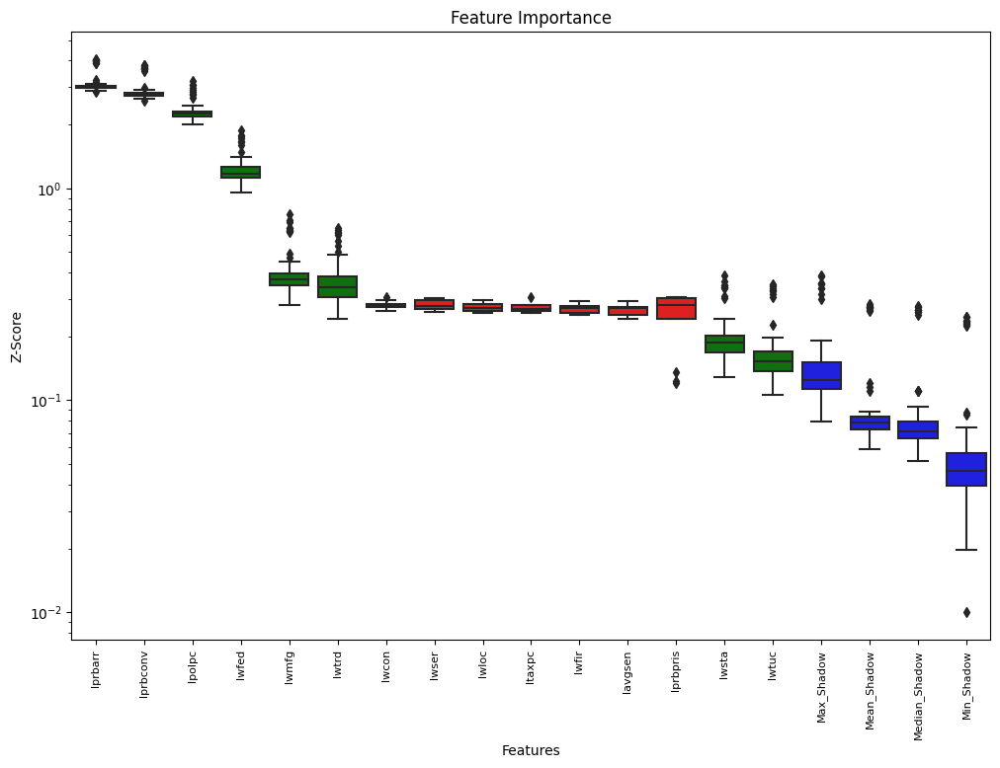

In [6]:
x = boruta_data.iloc[:, 1:]
y = boruta_data['crmrte']
Feature_Selector = BorutaShap(importance_measure='shap', classification=False)
Feature_Selector.fit(X = x, y = y, n_trials=100, random_state=0)
Feature_Selector.plot(which_features='all')

There are 8 confirmed important attributes 
8 attributes confirmed important: ['lprbarr', 'lprbconv', 'lwfed', 'lwtrd', 'lwmfg', 'lwsta', 'lwtuc', 'lpolpc']
There are 7 confirmed unimportant 
7 attributes confirmed unimportant: ['lwcon', 'lwser', 'lprbpris', 'lavgsen', 'ltaxpc', 'lwfir', 'lwloc']

We also removed some other variables that we originally wanted to include. You can see those in the commment below. Please note that further in the analysis we also removed additional variables 

In [6]:
# Removed density due to multicollinearity 
# Removed percent minority, and pctymle (same reasoning as Bouston Housing dataset removal) 
# We're going to use crmrte','lwtuc', 'lwsta', 'lwfed', 'lprbconv', 'lpolpc', 'lwtrd', 'lwmfg', 'lprbarr'

In [3]:
Final_data = crime4[['crmrte','lwtuc', 'lwsta', 'lwfed', 'lprbconv', 'lpolpc', 'lwtrd', 'lwmfg', 'lprbarr']]
Final_data.head()

,crmrte,lwtuc,lwsta,lwfed,lprbconv,lpolpc,lwtrd,lwmfg,lprbarr
0,0.039885,5.810005,5.464848,6.014619,-0.911149,-6.327340,5.205835,5.434246,-1.238923
1,0.038345,5.911600,5.536862,6.039540,-0.837006,-6.338704,5.244607,5.482013,-1.084381
2,0.030305,7.240509,5.522900,6.084157,-0.643019,-6.300291,5.281372,5.597310,-1.107303
3,0.034726,5.988612,5.568077,6.129421,-0.503013,-6.273361,5.301128,5.640985,-1.014662
4,0.036573,5.882718,5.639919,6.195282,-0.546931,-6.253162,5.332152,5.700042,-1.122715


## (b) Using standard techniques, identify at least 2-3 factor variables to include as predictors.
##### We chose the variables "west", "central" and "urban" for our indicator variables.

In [8]:
# Model without indicator variables
model_NI = smf.ols(formula = 'crmrte~lwtuc+lwsta+lwfed+lprbconv+lpolpc+lwtrd+lwmfg+lprbarr',
                data = Final_data)
results = model_NI.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                 crmrte   R-squared:                       0.586
Model:                            OLS   Adj. R-squared:                  0.581
Method:                 Least Squares   F-statistic:                     109.8
Date:                Tue, 21 Nov 2023   Prob (F-statistic):          1.36e-113
Time:                        22:00:29   Log-Likelihood:                 1911.0
No. Observations:                 630   AIC:                            -3804.
Df Residuals:                     621   BIC:                            -3764.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.0058      0.023     -0.252      0.8

This is our current model without indicator variables. As you can see the intercept is negative and non significant. As the model is now it is uninterpretable. We will now include the indicator variables of 'west', 'central' and 'urban', in an attempt to improve the prediction power of the model. The economic intuition for their inclusion is that crime varies across space within the United States, so we can expect to find differing levels of crime rate in different areas. 

In [7]:
# Here, we add the 3 indicator variables to Final_data
Final_data = crime4[['crmrte','lwtuc', 'lwsta', 'lwfed', 'lprbconv', 'lpolpc', 'lwtrd', 'lwmfg', 'lprbarr', 'west', 'central', 'urban']]
Final_data.head()

,crmrte,lwtuc,lwsta,lwfed,lprbconv,lpolpc,lwtrd,lwmfg,lprbarr,west,central,urban
0,0.039885,5.810005,5.464848,6.014619,-0.911149,-6.327340,5.205835,5.434246,-1.238923,0,1,0
1,0.038345,5.911600,5.536862,6.039540,-0.837006,-6.338704,5.244607,5.482013,-1.084381,0,1,0
2,0.030305,7.240509,5.522900,6.084157,-0.643019,-6.300291,5.281372,5.597310,-1.107303,0,1,0
3,0.034726,5.988612,5.568077,6.129421,-0.503013,-6.273361,5.301128,5.640985,-1.014662,0,1,0
4,0.036573,5.882718,5.639919,6.195282,-0.546931,-6.253162,5.332152,5.700042,-1.122715,0,1,0


With the model without indicator variables we observe 3 stastistically insignificant variables including the intercept.

In [13]:
# Model with indicator variables
model = smf.ols(formula = 'crmrte~lwtuc+lwsta+lwfed+lprbconv+lpolpc+lwtrd+lwmfg+lprbarr+I(west)+I(central)+I(urban)',
                data = Final_data)
results1 = model.fit()
print(results1.summary())

                            OLS Regression Results                            
Dep. Variable:                 crmrte   R-squared:                       0.737
Model:                            OLS   Adj. R-squared:                  0.733
Method:                 Least Squares   F-statistic:                     157.8
Date:                Tue, 21 Nov 2023   Prob (F-statistic):          2.76e-171
Time:                        22:01:08   Log-Likelihood:                 2054.6
No. Observations:                 630   AIC:                            -4085.
Df Residuals:                     618   BIC:                            -4032.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0620      0.019      3.219      0.0

The above model includes indicator variables. The intercept is no longer stastistically insignificant and this model also shows a higher r-squared. We can now interpret the coefficients. For all the log variables we can say that a 1% increase in them exhibits a Bk/100 change in crimerate. We still notice that some variables are statistically insignificant such wage manufacturing and wage transportation. We should remove these in future regressions, but wait until we run a mallow's CP and figure out the best model fit. 

(b)The combined predictors from parts (a) and (b) are the ones you will work with going forward in the analysis for parts (2) and (3).

In [11]:
# Mallow CP
import itertools
model = smf.ols(formula='crmrte~lwtuc+lwsta+lwfed+lprbconv+lpolpc+lwtrd+lwmfg+lprbarr+I(west)+I(central)+I(urban)',
                data=Final_data)
results = model.fit()
y = Final_data['crmrte']
y_pred = results.fittedvalues


storage_cp = pd.DataFrame(columns = ["Variables", "CP"])
k = 13

for L in range(1, len(Final_data.columns[0:]) + 1):
    for subset in itertools.combinations(Final_data.columns[0:], L):

        formula1 = 'crmrte ~ '+'+'.join(subset)

        results = smf.ols(formula=formula1, data=Final_data).fit()
        y_sub = results.fittedvalues
        p = len(subset)+1

        cp = mallow.mallow(y, y_pred,y_sub, k, p)

        storage_cp = storage_cp._append({'Variables': subset, 'CP': cp}, ignore_index = True)

In [12]:
# Changes maximum column width for readability
pd.set_option('max_colwidth', 400)

In [13]:
# Here, we limit output to CP values >= 0 and <= 20
Results = storage_cp.loc[(storage_cp['CP'] >= 0) & (storage_cp['CP'] <= 20)]
Results.sort_values(by = "CP")

,Variables,CP
4010,"(lwsta, lwfed, lprbconv, lpolpc, lwtrd, lprbarr, west, central, urban)",8.074586
4081,"(lwsta, lwfed, lprbconv, lpolpc, lwtrd, lwmfg, lprbarr, west, central, urban)",9.270936
4075,"(lwtuc, lwsta, lwfed, lprbconv, lpolpc, lwtrd, lprbarr, west, central, urban)",9.671440
3765,"(lwsta, lwfed, lprbconv, lpolpc, lprbarr, west, central, urban)",10.130308
4093,"(lwtuc, lwsta, lwfed, lprbconv, lpolpc, lwtrd, lwmfg, lprbarr, west, central, urban)",11.000000
4011,"(lwsta, lwfed, lprbconv, lpolpc, lwmfg, lprbarr, west, central, urban)",11.726618
3975,"(lwtuc, lwsta, lwfed, lprbconv, lpolpc, lprbarr, west, central, urban)",11.891763
4076,"(lwtuc, lwsta, lwfed, lprbconv, lpolpc, lwmfg, lprbarr, west, central, urban)",13.564072


Best model according to mallow cp (lwtuc, lwsta, lwfed, lprbconv, lpolpc, lwmfg, lprbarr, west, central, urban). lwtrd has now been removed. 

In [14]:
# Mallow CP output model
model2 = smf.ols(formula ='crmrte~lwtuc+lwsta+lwfed+lprbconv+lpolpc+lwmfg+lprbarr+I(west)+I(central)+I(urban)',
                data = Final_data)
results2 = model2.fit()
print(results2.summary())

                            OLS Regression Results                            
Dep. Variable:                 crmrte   R-squared:                       0.736
Model:                            OLS   Adj. R-squared:                  0.731
Method:                 Least Squares   F-statistic:                     172.1
Date:                Tue, 21 Nov 2023   Prob (F-statistic):          1.98e-171
Time:                        22:01:16   Log-Likelihood:                 2052.3
No. Observations:                 630   AIC:                            -4083.
Df Residuals:                     619   BIC:                            -4034.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0672      0.019      3.510      0.0

#### 2. Descriptive Analysis: Perform a univariate analysis following the steps below.

We will be analyzing crime data for specific counties in North Carolina from the years 1981 to 1987. Our goal is to ultimately find out the most appropriate variables that contributed to the crime rate in the specific counties.

#### (a) Begin by providing a descriptive analysis of your variables (include all predictors and response variable). This should include things like histograms, quantile plots, correlation plots, etc.

#### Variable Names:

crmrte: crimes commited per person  
lprbarr: log of the probability of arrest 
lprbconv: log of the probability of conviction  
lpolpc: log of police per capita  
lwtuc: log of weekly trns, util, commun wages  
lwtrd: log of weekly whlesle, retail trade, wages  
lwmfg: log of weekly manufacturing wages  
lwfed: log of weekly fed wages  
lwsta: log of weekly state wages  
west: Equals 1 if in western NC  
central: Equals 1 if in central NC  
urban: Equals 1 if in SMSA  

In [15]:
# Check for null values
Final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 630 entries, 0 to 629
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   crmrte    630 non-null    float64
 1   lwtuc     630 non-null    float64
 2   lwsta     630 non-null    float64
 3   lwfed     630 non-null    float64
 4   lprbconv  630 non-null    float64
 5   lpolpc    630 non-null    float64
 6   lwtrd     630 non-null    float64
 7   lwmfg     630 non-null    float64
 8   lprbarr   630 non-null    float64
 9   west      630 non-null    int64  
 10  central   630 non-null    int64  
 11  urban     630 non-null    int64  
dtypes: float64(9), int64(3)
memory usage: 59.2 KB


We continue to use the subset we had earlier

In [16]:
#
model2 = smf.ols(formula ='crmrte~lwtuc+lwsta+lwfed+lprbconv+lpolpc+lwmfg+lprbarr+I(west)+I(central)+I(urban)',
                data = Final_data)
results2 = model2.fit()
print(results2.summary())

                            OLS Regression Results                            
Dep. Variable:                 crmrte   R-squared:                       0.736
Model:                            OLS   Adj. R-squared:                  0.731
Method:                 Least Squares   F-statistic:                     172.1
Date:                Tue, 21 Nov 2023   Prob (F-statistic):          1.98e-171
Time:                        16:42:29   Log-Likelihood:                 2052.3
No. Observations:                 630   AIC:                            -4083.
Df Residuals:                     619   BIC:                            -4034.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0672      0.019      3.510      0.0

The initial OLS regression does not indicate multicollinearity, which is a good sign. There are two p-values that are not statistically significant: lwtuc, and lwmfg (all are close to zero). Maybe a logit regression or a 2 stage least squares would be appropriate for these variables rather than normal regression.

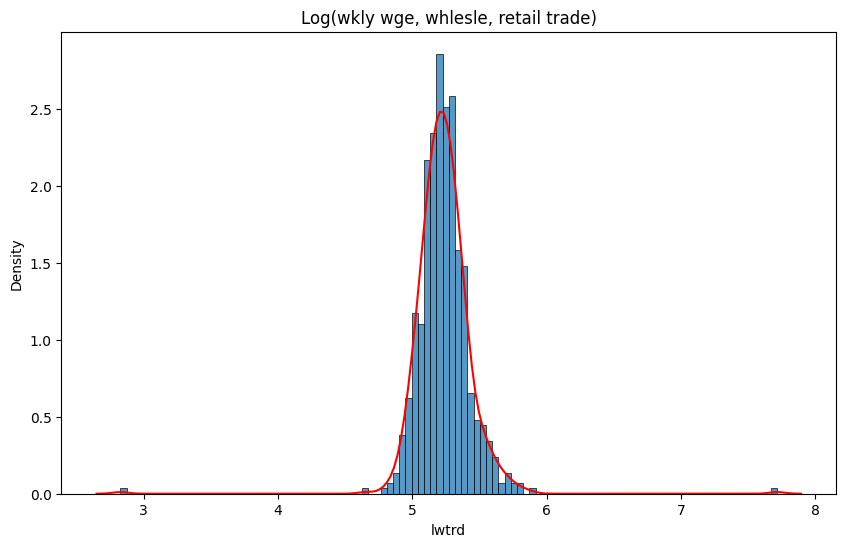

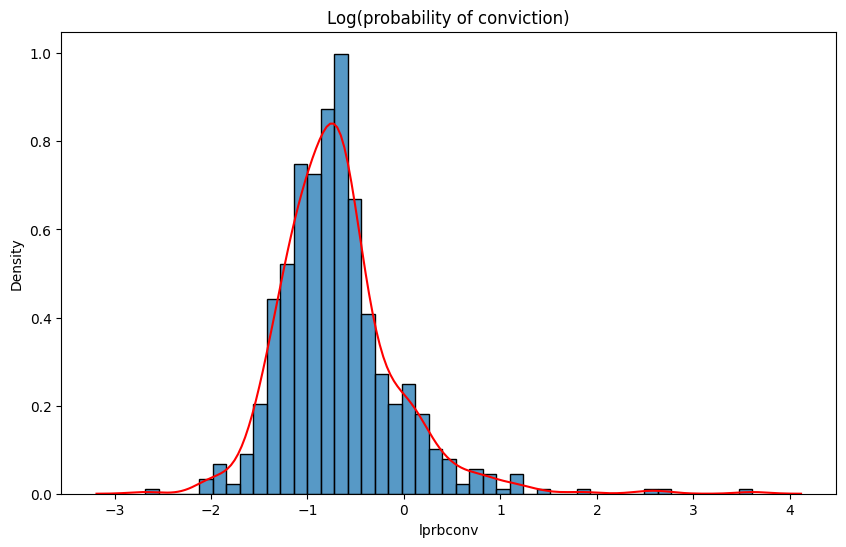

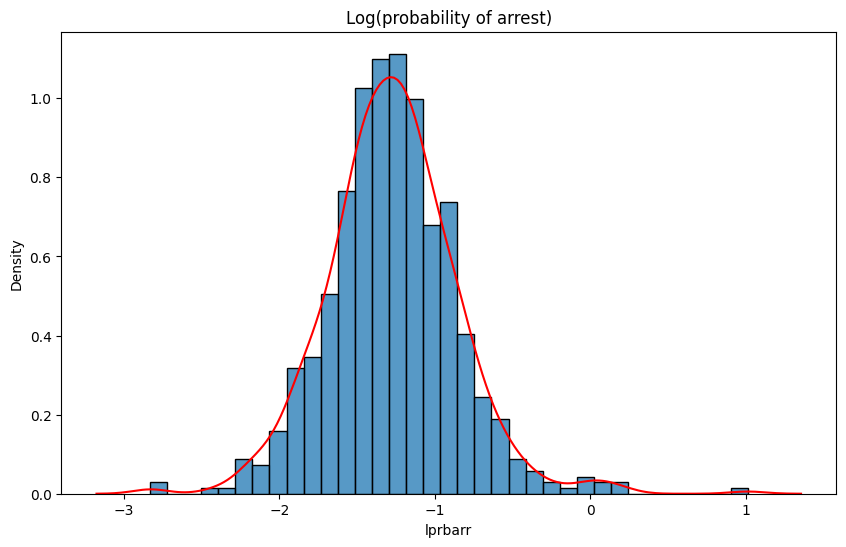

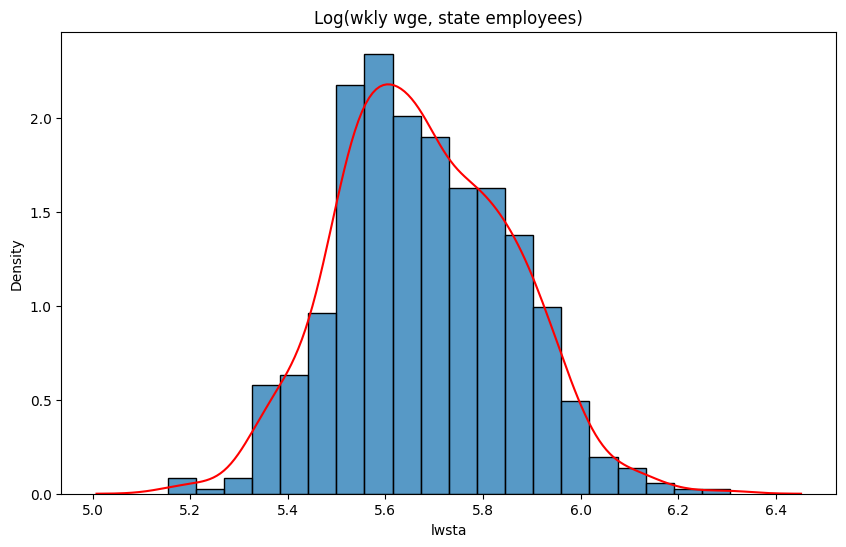

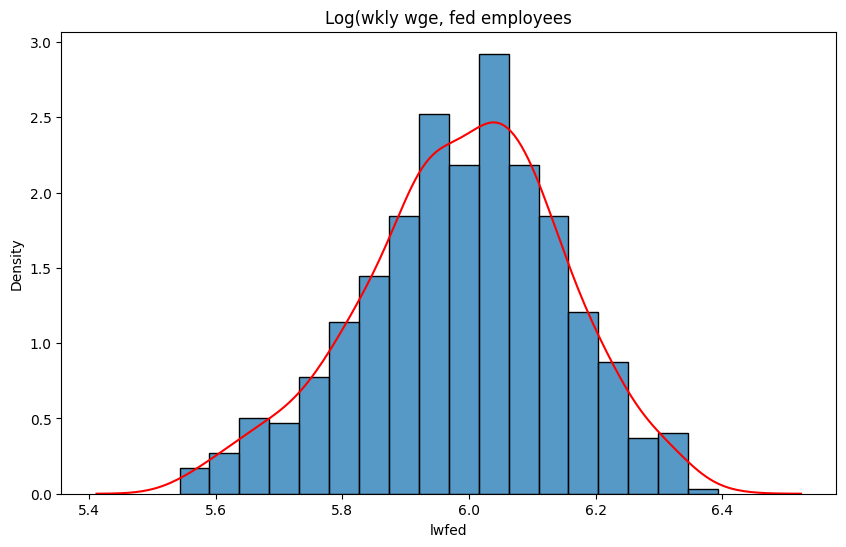

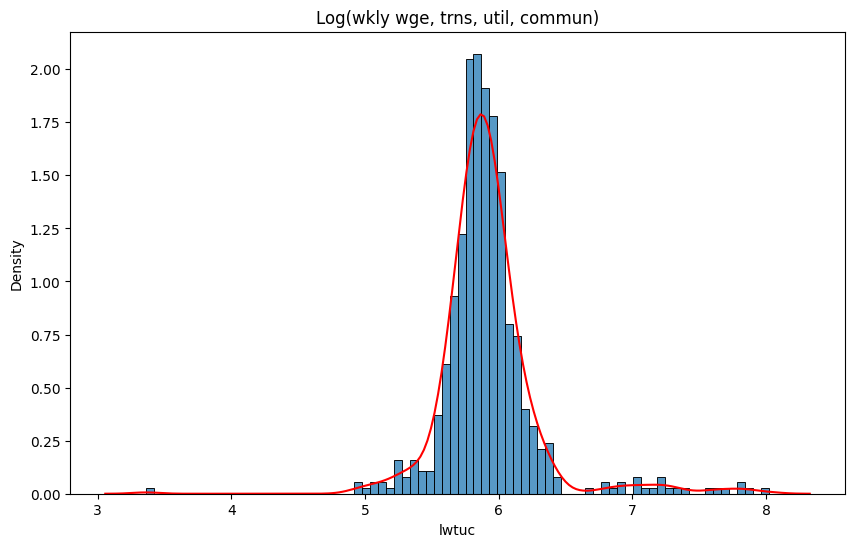

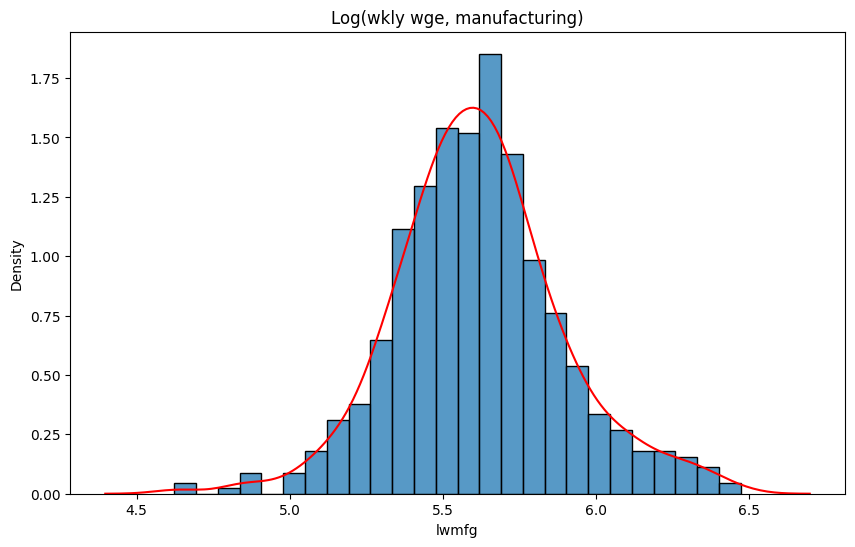

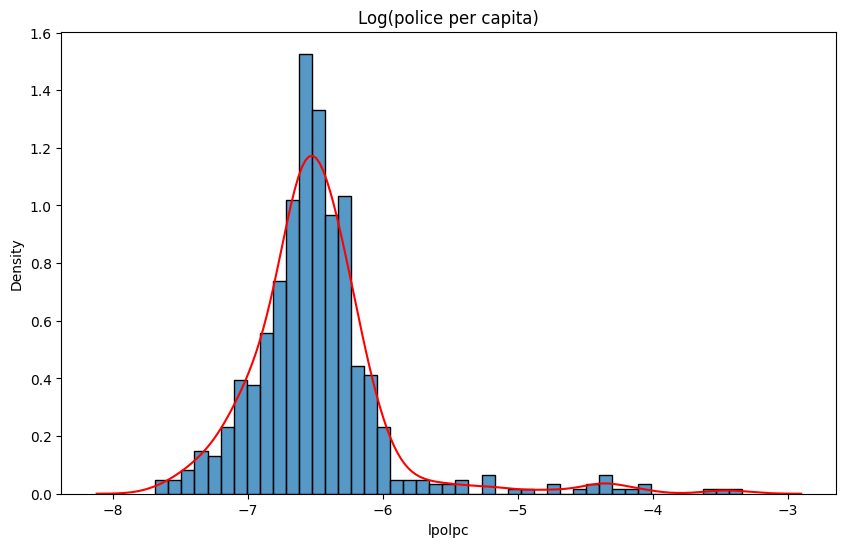

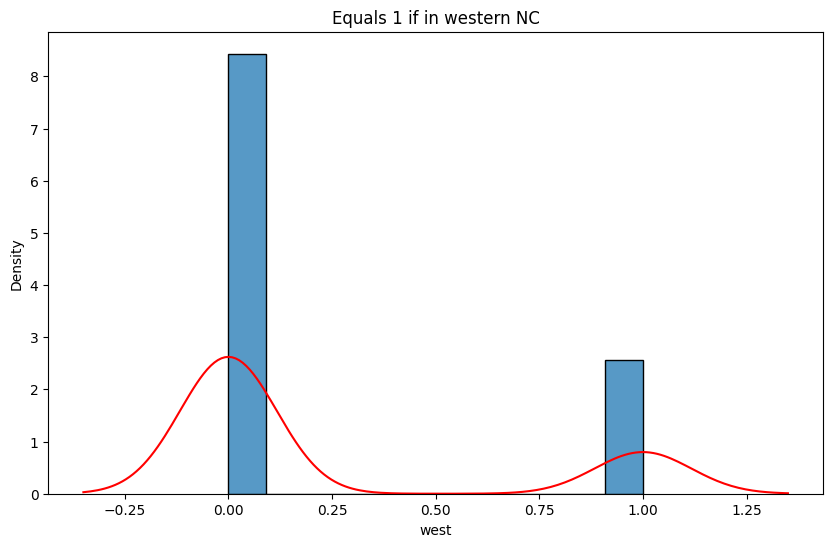

In [64]:
# Histograms and Density plots

plt.figure(figsize = (10,6))
sns.histplot(Final_data.lwtrd, stat = "density")
sns.kdeplot(Final_data.lwtrd, color = "red")
plt.title("Log(wkly wge, whlesle, retail trade)")
plt.show()

plt.figure(figsize = (10,6))
sns.histplot(crime4.lprbconv, stat = "density")
sns.kdeplot(crime4.lprbconv, color = "red")
plt.title("Log(probability of conviction)")
plt.show()

plt.figure(figsize = (10,6))
sns.histplot(crime4.lprbarr, stat = "density")
sns.kdeplot(crime4.lprbarr, color = "red")
plt.title("Log(probability of arrest)")
plt.show()

plt.figure(figsize = (10,6))
sns.histplot(crime4.lwsta, stat = "density")
sns.kdeplot(crime4.lwsta, color = "red")
plt.title("Log(wkly wge, state employees)")
plt.show()

plt.figure(figsize = (10,6))
sns.histplot(crime4.lwfed, stat = "density")
sns.kdeplot(crime4.lwfed, color = "red")
plt.title("Log(wkly wge, fed employees")
plt.show()

plt.figure(figsize = (10,6))
sns.histplot(crime4.lwtuc, stat = "density")
sns.kdeplot(crime4.lwtuc, color = "red")
plt.title("Log(wkly wge, trns, util, commun)")
plt.show()

plt.figure(figsize = (10,6))
sns.histplot(crime4.lwmfg, stat = "density")
sns.kdeplot(crime4.lwmfg, color = "red")
plt.title("Log(wkly wge, manufacturing)")
plt.show()

plt.figure(figsize = (10,6))
sns.histplot(crime4.lpolpc, stat = "density")
sns.kdeplot(crime4.lpolpc, color = "red")
plt.title("Log(police per capita)")
plt.show()

plt.figure(figsize = (10,6))
sns.histplot(crime4.west, stat = "density")
sns.kdeplot(crime4.west, color = "red")
plt.title("Equals 1 if in western NC")
plt.show()

The density curve on the above plots appears to show normal distributions for every variable. The variables lprbconv, lwtuc, and  lpolpc appear to be skewed compared to the rest of the variables. There is a right tail on police per capita and probability of conviction (as well as all the values being negative, meaning we have to change our interpretation somewhat). We might have to remove outliers although it seems unlikely. Ultimately outliers are still are apart of the legal system and should be represented in the data. 

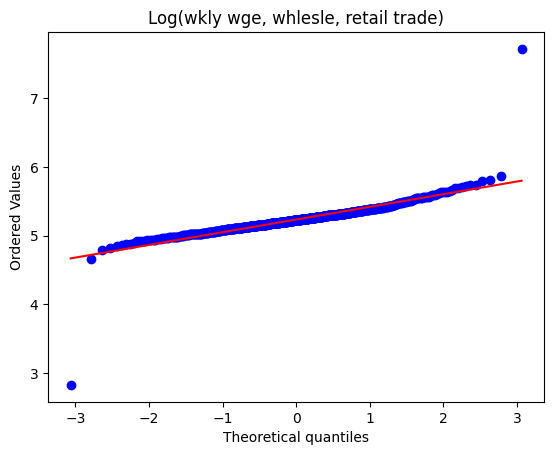

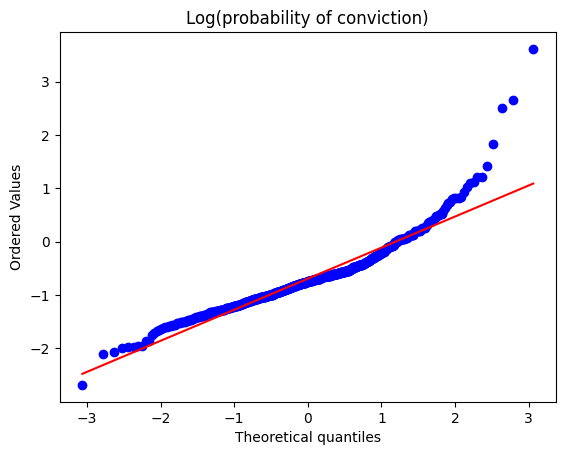

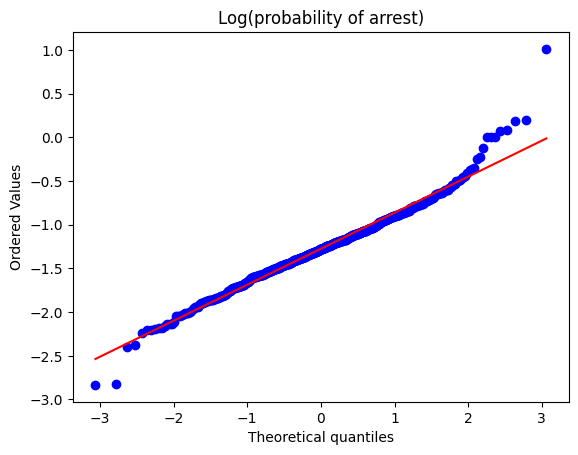

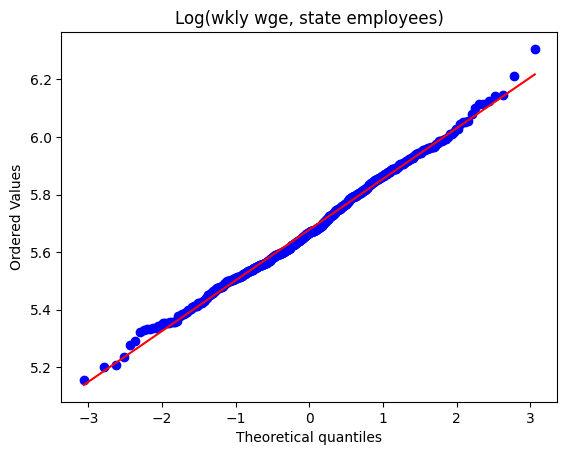

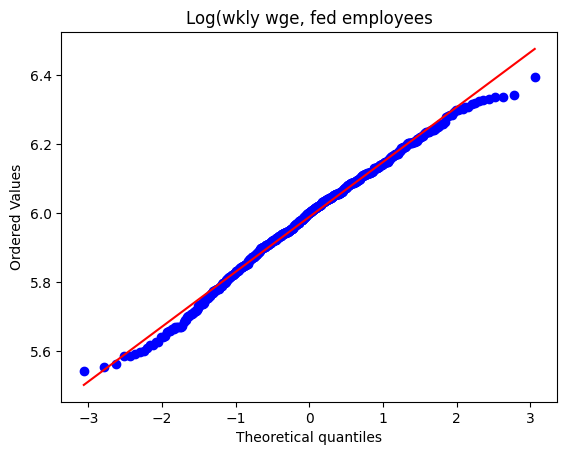

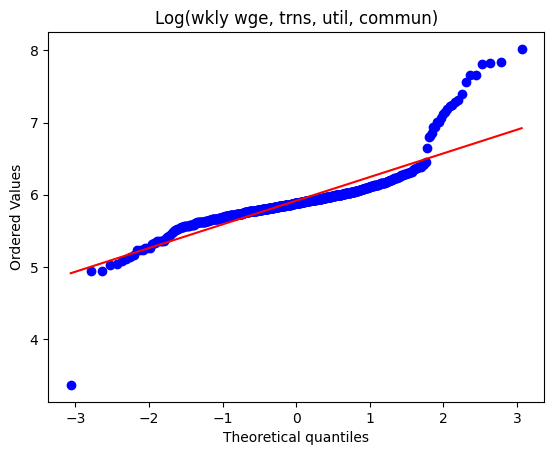

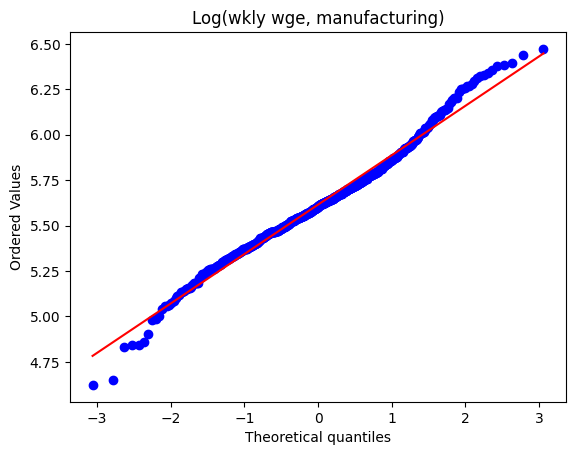

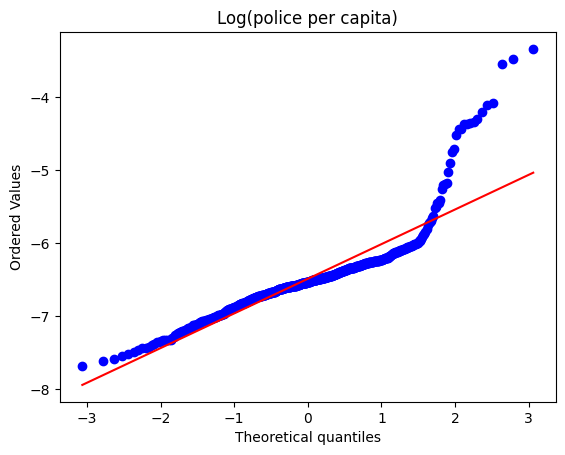

In [18]:
# QQ-Plots

stats.probplot(crime4.lwtrd, dist = "norm", plot = plt)
plt.title("Log(wkly wge, whlesle, retail trade)")
plt.show()

stats.probplot(crime4.lprbconv, dist = "norm", plot = plt)
plt.title("Log(probability of conviction)")
plt.show()

stats.probplot(crime4.lprbarr, dist = "norm", plot = plt)
plt.title("Log(probability of arrest)")
plt.show()

stats.probplot(crime4.lwsta, dist = "norm", plot = plt)
plt.title("Log(wkly wge, state employees)")
plt.show()

stats.probplot(crime4.lwfed, dist = "norm", plot = plt)
plt.title("Log(wkly wge, fed employees")
plt.show()

stats.probplot(crime4.lwtuc, dist = "norm", plot = plt)
plt.title("Log(wkly wge, trns, util, commun)")
plt.show()

stats.probplot(crime4.lwmfg, dist = "norm", plot = plt)
plt.title("Log(wkly wge, manufacturing)")
plt.show()

stats.probplot(crime4.lpolpc, dist = "norm", plot = plt)
plt.title("Log(police per capita)")
plt.show()

There are a few variables that seem to not be normally distributed: lprbconv, lwtuc, and lpolpc. They might have more poisson like distributions on account of their long right tail. This is interesting because these are the three variables that will need to be transformed because of their skew in the density plots. 

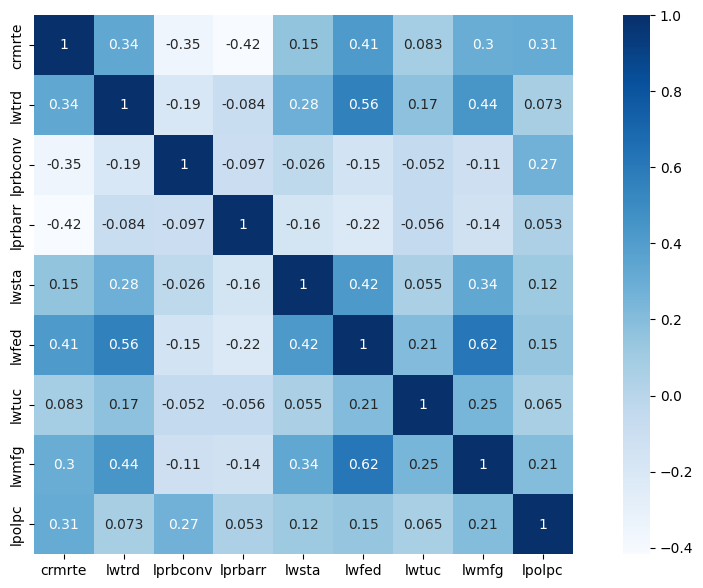

In [19]:
# Correlation Plot
r_vars = crime4[['crmrte','lwtrd','lprbconv','lprbarr','lwsta','lwfed','lwtuc','lwmfg','lpolpc']]

plt.figure(figsize=(13,7))
data = r_vars
c = data.corr()
sns.heatmap(c,cmap = "Blues", annot = True, square = True)
plt.show()

Crime Rate has the highest correlations (over +-0.30) with lwtrd, lprobconv, lprbarr, lwfed, lwmfg, and lpolpc. It's a little concerning to see the high correlations with these variables and the dependent variable, especially because we could be dealing with endogeneity. That being said we still want a certain level of correlation. 

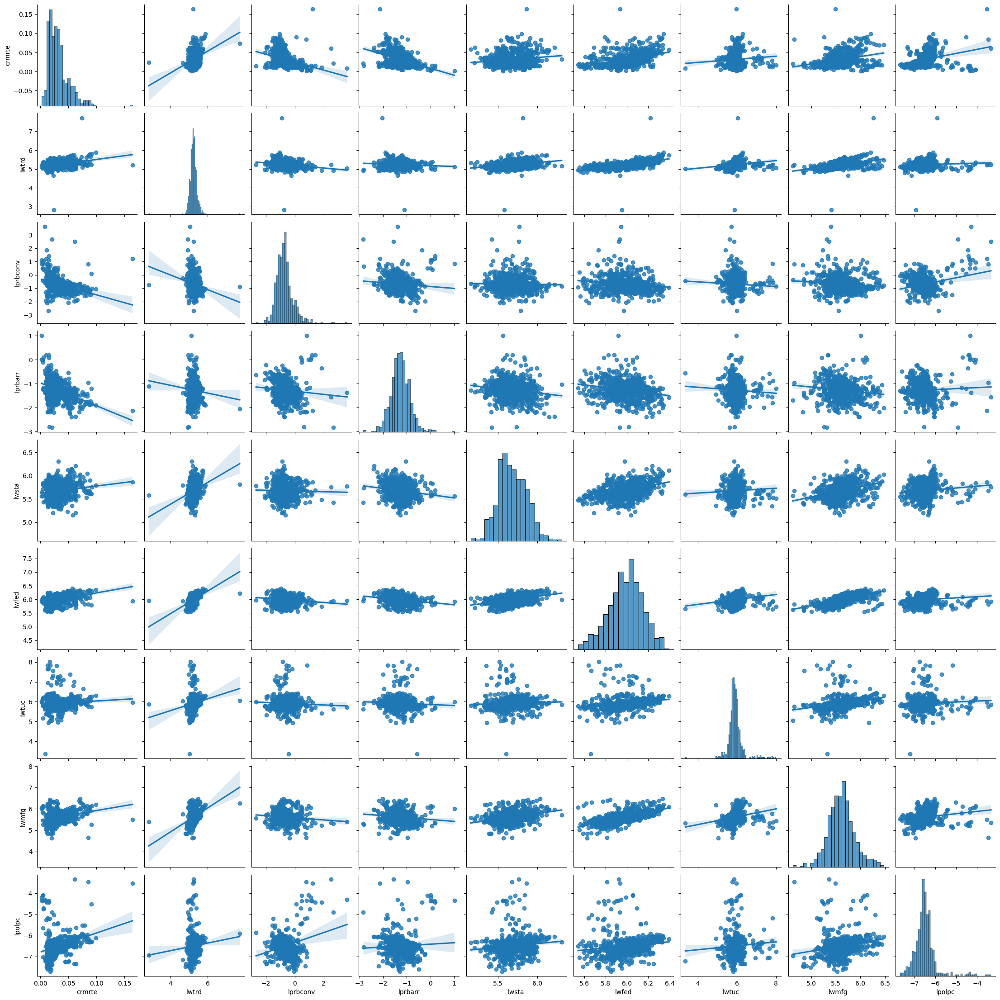

In [20]:
# Pair Plot
sns.pairplot(r_vars, kind = 'reg')
plt.show()

The pairplot shows what we already knew from the correlation plot and the histogram/qqplots. 

#### (b) Estimate density distributions (e.g., Cullen & Frey) for all your variables, and show the plots with the respective fits.

from fitter import Fitter
f = Fitter(crime4.crmrte)
f.fit()
f.summary()

SKIPPED _fit distribution (taking more than 30 seconds)
SKIPPED beta distribution (taking more than 30 seconds)
SKIPPED alpha distribution (taking more than 30 seconds)
SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED exponweib distribution (taking more than 30 seconds)
SKIPPED f distribution (taking more than 30 seconds)
SKIPPED fatiguelife distribution (taking more than 30 seconds)
SKIPPED fisk distribution (taking more than 30 seconds)
SKIPPED foldcauchy distribution (taking more than 30 seconds)
SKIPPED foldnorm distribution (taking more than 30 seconds)
SKIPPED gausshyper distribution (taking more than 30 seconds)
SKIPPED kstwo distribution (taking more than 30 seconds)
SKIPPED genexpon distribution (taking more than 30 seconds)
SKIPPED genextreme distribution (taking more than 30 second

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
genhyperbolic,0.344759,1278.294242,1300.522841,inf,0.018327,0.981484
genlogistic,0.377365,2182.140622,2195.477781,inf,0.024372,0.839298
hypsecant,0.393119,1813.011167,1821.902606,inf,0.030384,0.595005
logistic,0.423309,2098.070238,2106.961678,inf,0.029525,0.631224
dgamma,0.538769,1796.391892,1809.729052,inf,0.039236,0.279318


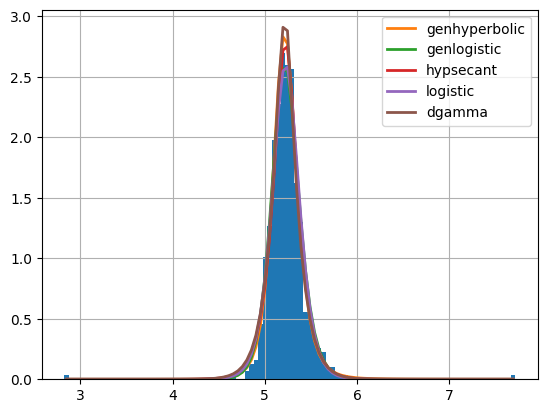

In [23]:
f = Fitter(crime4.lwtrd)
f.fit()
f.summary()

SKIPPED _fit distribution (taking more than 30 seconds)
SKIPPED alpha distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED chi distribution (taking more than 30 seconds)
SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED chi2 distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED exponweib distribution (taking more than 30 seconds)
SKIPPED f distribution (taking more than 30 seconds)
SKIPPED fatiguelife distribution (taking more than 30 seconds)
SKIPPED fisk distribution (taking more than 30 seconds)
SKIPPED foldcauchy distribution (taking more than 30 seconds)
SKIPPED foldnorm distribution (taking more than 30 seconds)
SKIPPED gausshyper distribution (taking more than 30 seconds)
SKIPPED genexpon distribution (taking more than 30 seconds)
SKIPPED genextreme distribution (taking more than 30 seconds)

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
genhyperbolic,0.594078,743.299291,765.527890,inf,0.029439,0.634862
hypsecant,0.648292,895.318091,904.209531,inf,0.040525,0.245375
dgamma,0.650635,860.293025,873.630184,inf,0.042742,0.194322
dweibull,0.660323,860.868817,874.205976,inf,0.043718,0.174638
genlogistic,0.669263,888.141711,901.478871,inf,0.053147,0.054899


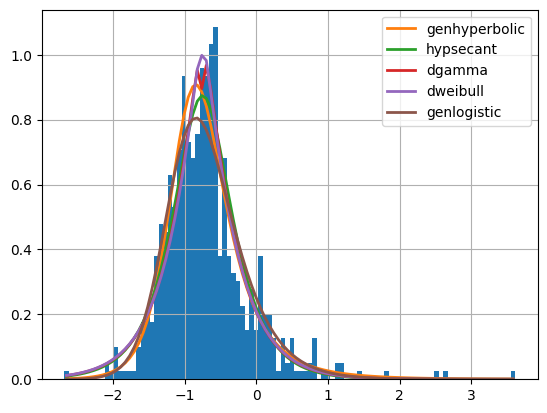

In [24]:
f = Fitter(crime4.lprbconv)
f.fit()
f.summary()

SKIPPED _fit distribution (taking more than 30 seconds)
SKIPPED alpha distribution (taking more than 30 seconds)
SKIPPED argus distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
SKIPPED beta distribution (taking more than 30 seconds)
SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED chi2 distribution (taking more than 30 seconds)
SKIPPED chi distribution (taking more than 30 seconds)
SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED erlang distribution (taking more than 30 seconds)
SKIPPED exponpow distribution (taking more than 30 seconds)
SKIPPED exponweib distribution (taking more than 30 seconds)
SKIPPED f distribution (taking more than 30 seconds)
SKIPPED fatiguelife distribution (taking more than 30 seconds)
SKIPPED fisk distribution (taking more than 30 seconds)
SKIPPED foldcauchy distribution (taking more than 30 seconds)
SKIPPED fold

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
logistic,1.162213,629.791730,638.683169,inf,0.017212,0.990676
genlogistic,1.169366,622.803986,636.141145,inf,0.016189,0.995654
dweibull,1.174377,622.783565,636.120724,inf,0.023373,0.873248
dgamma,1.217807,600.560281,613.897441,inf,0.027160,0.730753
hypsecant,1.221952,587.569410,596.460849,inf,0.019516,0.966271


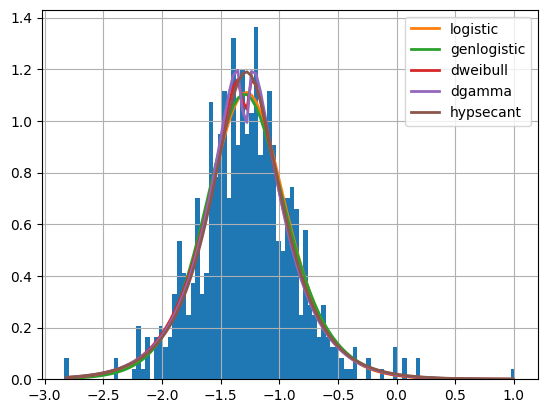

In [25]:
f = Fitter(crime4.lprbarr)
f.fit()
f.summary()

SKIPPED _fit distribution (taking more than 30 seconds)
SKIPPED alpha distribution (taking more than 30 seconds)
SKIPPED arcsine distribution (taking more than 30 seconds)
SKIPPED beta distribution (taking more than 30 seconds)
SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED argus distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED chi2 distribution (taking more than 30 seconds)
SKIPPED chi distribution (taking more than 30 seconds)
SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED erlang distribution (taking more than 30 seconds)
SKIPPED exponweib distribution (taking more than 30 seconds)
SKIPPED f distribution (taking more than 30 seconds)
SKIPPED fatiguelife distribution (taking more than 30 seconds)
SKIPPED fisk distribution (taking more than 30 seconds)
SKIPPED foldcauchy distribution (taking more than 30 seconds)
SKIPPED foldn

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gennorm,13.073174,221.043418,234.380577,inf,0.042767,0.193798
exponnorm,13.257271,198.945493,212.282653,inf,0.035298,0.403105
norm,13.526716,206.634345,215.525785,inf,0.039496,0.272192
gumbel_r,14.895700,206.172383,215.063823,inf,0.057886,0.028179
logistic,15.411177,177.271120,186.162560,inf,0.042314,0.203472


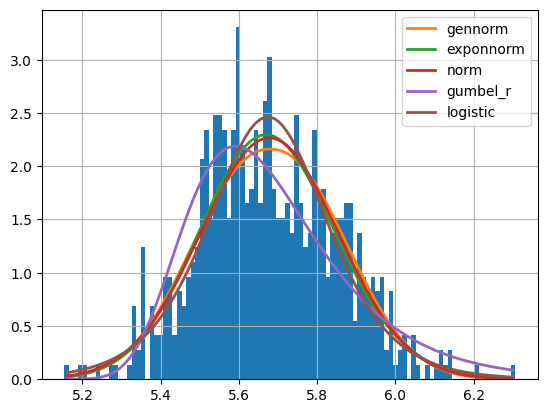

In [26]:
f = Fitter(crime4.lwsta)
f.fit()
f.summary()

SKIPPED _fit distribution (taking more than 30 seconds)
SKIPPED alpha distribution (taking more than 30 seconds)
SKIPPED arcsine distribution (taking more than 30 seconds)
SKIPPED beta distribution (taking more than 30 seconds)
SKIPPED argus distribution (taking more than 30 seconds)
SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED bradford distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED chi distribution (taking more than 30 seconds)
SKIPPED chi2 distribution (taking more than 30 seconds)
SKIPPED dgamma distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED erlang distribution (taking more than 30 seconds)
SKIPPED exponpow distribution (taking more than 30 seconds)
SKIPPED exponweib distribution (taking more than 30 seconds)
SKIPPED f distribution (taking more than 30 seconds)
SKIPPED fatiguel

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
dweibull,23.480251,67.191865,80.529024,inf,0.025111,0.812209
norm,25.021682,60.852792,69.744232,inf,0.035110,0.409753
exponnorm,25.021727,62.852202,76.189361,inf,0.035111,0.409724
gennorm,25.188527,62.846516,76.183675,inf,0.035839,0.384324
logistic,25.236393,63.704505,72.595945,inf,0.032014,0.527830


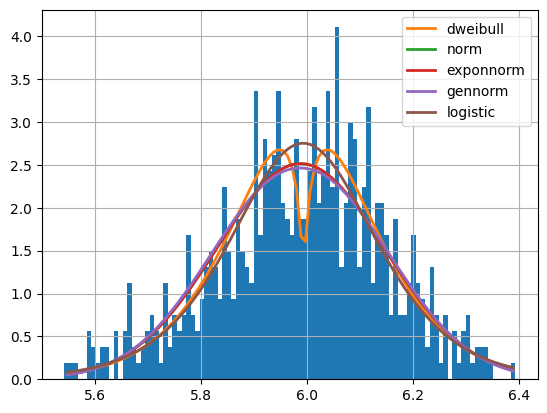

In [27]:
f = Fitter(crime4.lwfed)
f.fit()
f.summary()

SKIPPED _fit distribution (taking more than 30 seconds)
SKIPPED alpha distribution (taking more than 30 seconds)
SKIPPED arcsine distribution (taking more than 30 seconds)
SKIPPED argus distribution (taking more than 30 seconds)
SKIPPED bradford distribution (taking more than 30 seconds)
SKIPPED beta distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED chi distribution (taking more than 30 seconds)
SKIPPED chi2 distribution (taking more than 30 seconds)
SKIPPED dweibull distribution (taking more than 30 seconds)
SKIPPED dgamma distribution (taking more than 30 seconds)
SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED erlang distribution (taking more than 30 seconds)
SKIPPED exponpow distribution (taking more than 30 seconds)
SKIPPED f distribution (taking more than 30 seconds)
SKIPPED exponweib

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
laplace,0.843372,913.520525,922.411965,inf,0.059129,0.023437
laplace_asymmetric,0.874769,991.224955,1004.562114,inf,0.052169,0.062549
hypsecant,1.111721,1028.425710,1037.317150,inf,0.057479,0.029906
cauchy,1.228833,621.278322,630.169762,inf,0.058751,0.024800
logistic,1.799792,1127.958425,1136.849865,inf,0.066219,0.007601


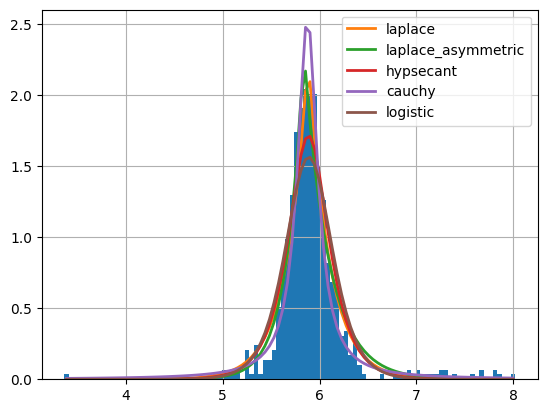

In [28]:
f = Fitter(crime4.lwtuc)
f.fit()
f.summary()

SKIPPED _fit distribution (taking more than 30 seconds)
SKIPPED alpha distribution (taking more than 30 seconds)
SKIPPED arcsine distribution (taking more than 30 seconds)
SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED argus distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
SKIPPED chi distribution (taking more than 30 seconds)
SKIPPED chi2 distribution (taking more than 30 seconds)
SKIPPED cosine distribution (taking more than 30 seconds)
SKIPPED bradford distribution (taking more than 30 seconds)
SKIPPED beta distribution (taking more than 30 seconds)
SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED dweibull distribution (taking more than 30 seconds)
SKIPPED erlang distribution (taking more than 30 seconds)
SKIPPED exponnorm distribution (taking more than 30 seconds)
SKIPPED exponpow distribution (taking more than 30 seconds)
SKIPPED e

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
dgamma,3.163954,291.448221,304.785380,inf,0.019793,0.961837
hypsecant,3.197885,288.301364,297.192804,inf,0.020893,0.940734
logistic,3.291474,298.174522,307.065962,inf,0.021042,0.937430
gennorm,3.376732,293.732053,307.069212,inf,0.022950,0.886554
norm,4.507798,317.383832,326.275272,inf,0.048599,0.098684


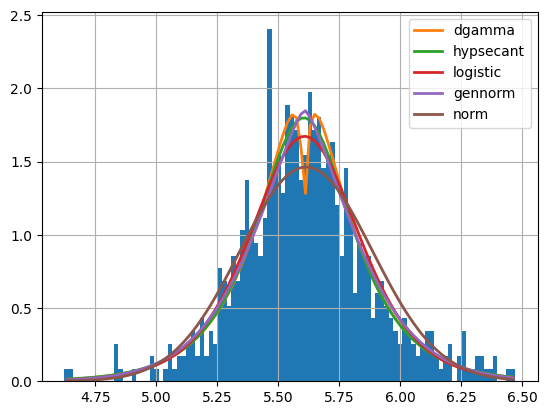

In [29]:
f = Fitter(crime4.lwmfg)
f.fit()
f.summary()

SKIPPED _fit distribution (taking more than 30 seconds)
SKIPPED alpha distribution (taking more than 30 seconds)
SKIPPED arcsine distribution (taking more than 30 seconds)
SKIPPED argus distribution (taking more than 30 seconds)
SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED beta distribution (taking more than 30 seconds)
SKIPPED bradford distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
SKIPPED chi2 distribution (taking more than 30 seconds)
SKIPPED chi distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED cosine distribution (taking more than 30 seconds)
SKIPPED dgamma distribution (taking more than 30 seconds)
SKIPPED dweibull distribution (taking more than 30 seconds)
SKIPPED erlang distribution (taking more than 30 seconds)
SKIPPED exponnorm distribution (taking more than 30 seconds)
SKIPPED exp

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
laplace,0.719892,734.558221,743.449661,inf,0.040904,0.235991
laplace_asymmetric,0.890233,676.151331,689.488490,inf,0.064766,0.009673
cauchy,1.005482,571.528724,580.420163,inf,0.056167,0.036127
hypsecant,1.086690,802.647305,811.538745,inf,0.050718,0.075577
logistic,1.490485,864.709541,873.600981,inf,0.063648,0.011603


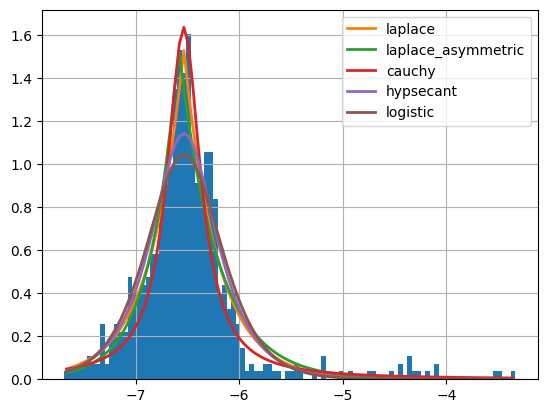

In [30]:
f = Fitter(crime4.lpolpc)
f.fit()
f.summary()

## (c) Identify if there are any non-linearities within your variables. What transformations should you perform to make them linear? What would happen if you included nonlinear variables in your regression models without transforming them first?

In [21]:
ProfileReport(Final_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

As shown in the above prifle reports as well as qqplots and so on we see that the log transformations leave what was originally highly positively skewed data that resembled a low shape parameter poisson distribution, as a more normal but still highly skewed dataset. As such we feel that any extra changes to the data is unnecessary and wouldn't necessarily give us the noram shape we are looking for. We will stick the log transformation and reevaluate as necessary. 

-0.411768554236666


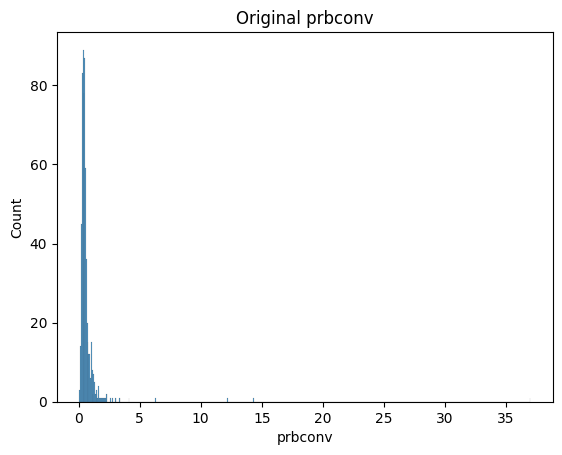

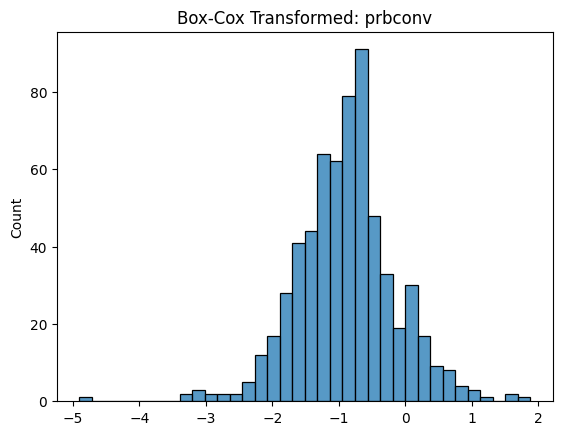

0.18995686000954123


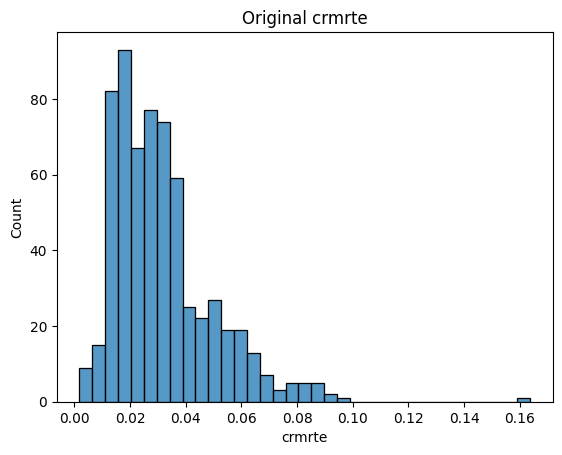

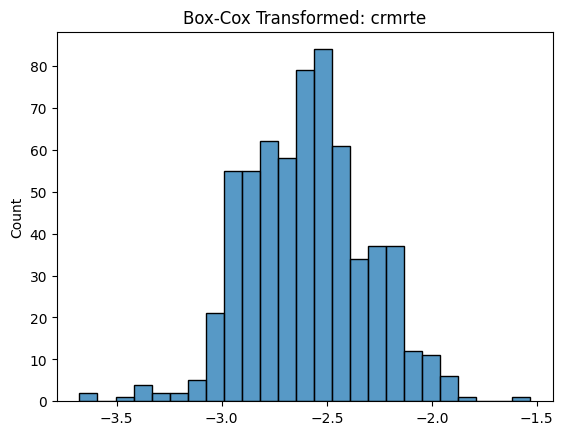

-0.24694333011263947


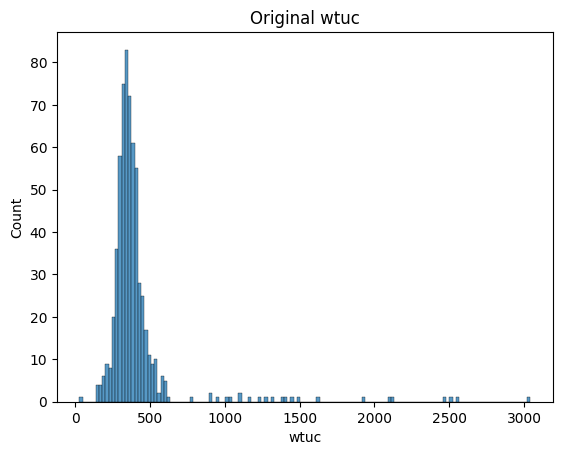

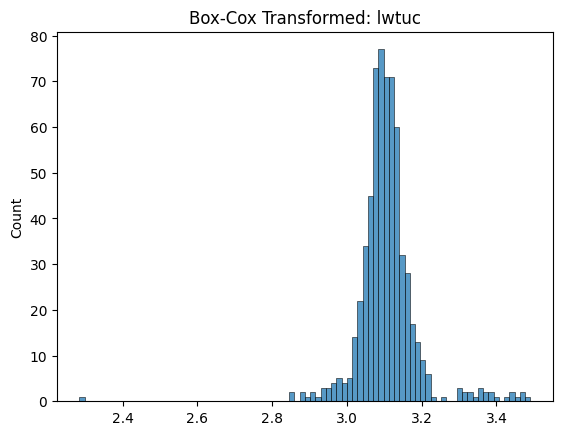

In [22]:
# Box-Cox Transformation of prbconv and crmrte
import scipy

bc_DRY,lambda_DRY = scipy.stats.boxcox(crime4['prbconv'])
print(lambda_DRY)

sns.histplot(crime4['prbconv'])
plt.title('Original prbconv')
plt.show()

sns.histplot(bc_DRY)
plt.title('Box-Cox Transformed: prbconv')
plt.show()

bc_ORY,lambda_ORY = scipy.stats.boxcox(crime4['crmrte'])
print(lambda_ORY)

sns.histplot(crime4['crmrte'])
plt.title('Original crmrte')
plt.show()

sns.histplot(bc_ORY)
plt.title('Box-Cox Transformed: crmrte')
plt.show()

bc_ORY,lambda_ORY = scipy.stats.boxcox(crime4['wtuc'])
print(lambda_ORY)

sns.histplot(crime4['wtuc'])
plt.title('Original wtuc')
plt.show()

sns.histplot(bc_ORY)
plt.title('Box-Cox Transformed: lwtuc')
plt.show()

Box-cox transformations still fail to achieve as good a shape as the log transformations do, in addition to hindering interpretation. We will continue to stick with the already provided log transformations. 

#### (d) Comment on any outliers and/or unusual features of your variables, and then justify their removal, exclusion, or imputation.

Here, five variables are regressed based on if a significant number of outliers are present in the QQ-plots. We cannot justify their removal for various reasons, including the fact that there are no clerical or input errors in the data. Removing high instances of crime rate would also significantly hinder our analysis over space of crime. These are real life values that we will see in the world (akin to doing a regression on income and having Bill Gates in your sample. We can't necessarily remove him because his money is real and he is a United States Citizen). There are also not enough outliers relative to the actual data to be worried about the residuals and their values being inflated.  

#### NEED TO TALK ABOUT LOG INTERPRETATION AND OUTLIERS

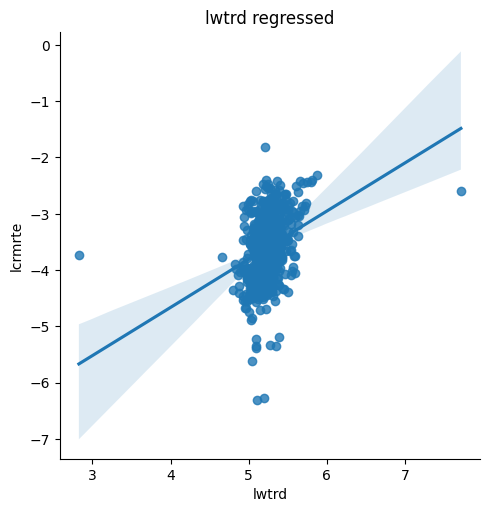

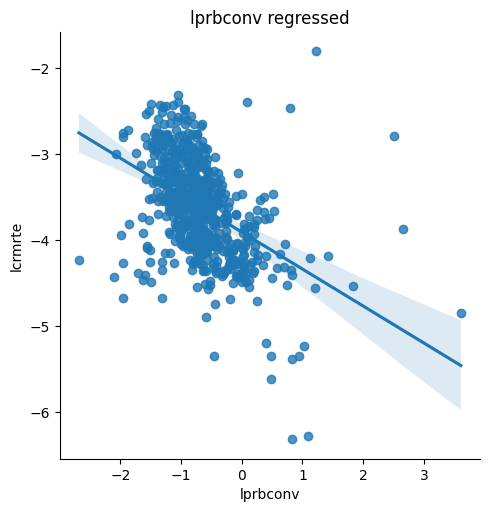

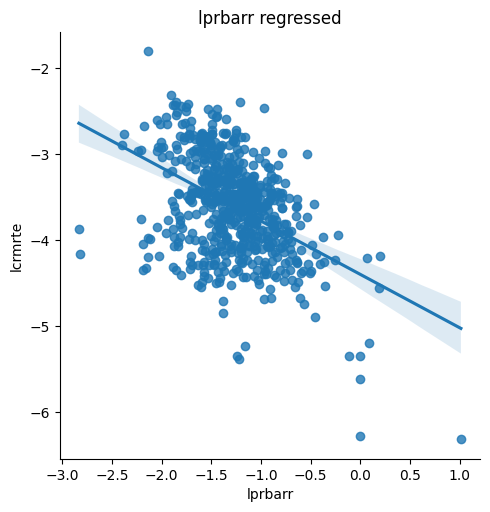

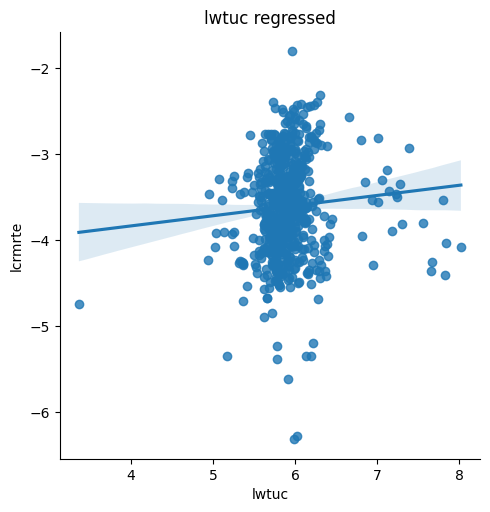

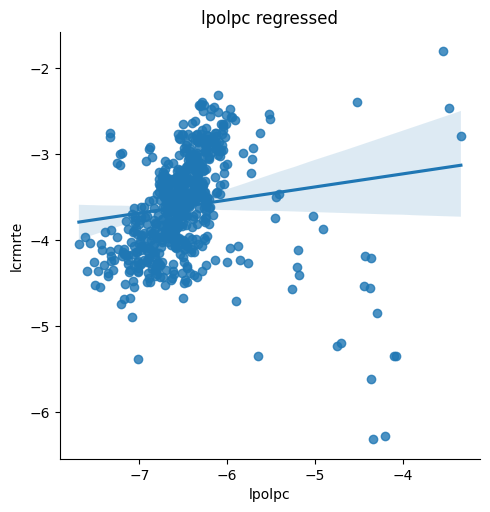

In [23]:
# Outliers
sns.lmplot(data = crime4, x = 'lwtrd', y = 'lcrmrte')
plt.title("lwtrd regressed")

sns.lmplot(data = crime4, x = 'lprbconv', y = 'lcrmrte')
plt.title("lprbconv regressed")

sns.lmplot(data = crime4, x = 'lprbarr', y = 'lcrmrte')
plt.title("lprbarr regressed")

sns.lmplot(data = crime4, x = 'lwtuc', y = 'lcrmrte')
plt.title("lwtuc regressed")

sns.lmplot(data = crime4, x = 'lpolpc', y = 'lcrmrte')
plt.title("lpolpc regressed")

plt.show()

#### (e) If you have any NAs, impute them using any of the methods discussed in class but make sure to justify your choice.

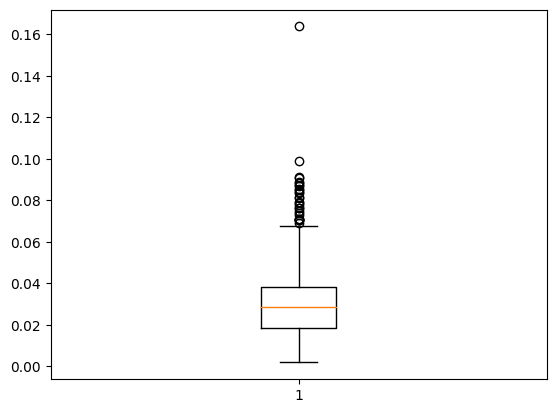

In [24]:
# Boxplots to show outliers
plt.boxplot(Final_data.crmrte)
plt.show()

Even though we have outliers, we elect to keep them in the model so as to maintain interprebility of our model results.

In [25]:
# Count the number of null values
Final_data.isnull().sum()

crmrte      0
lwtuc       0
lwsta       0
lwfed       0
lprbconv    0
lpolpc      0
lwtrd       0
lwmfg       0
lprbarr     0
west        0
central     0
urban       0
dtype: int64

We do not have any NAs as is confirmed above results from our reduced dataset. 

#### 3. Model Building: 
##### Explore several competing multiple-regression models and decide on one model only. You will need to explain in detail how you arrived at your preferred model. Discuss the economic significance of your parameters, and overall findings. Make sure you discuss your main conclusions and recommendations. Keep in mind that the order of the required checks below may vary as you may need to perform some of the tests more than once.

In [15]:
# This model excludes the two variables lwtuc and lwmfg
model3 = smf.ols(formula ='crmrte~lwsta+lwfed+lprbconv+lpolpc+lprbarr+I(west)+I(central)+I(urban)',
                data = Final_data)
results3 = model3.fit()
print(results3.summary())

                            OLS Regression Results                            
Dep. Variable:                 crmrte   R-squared:                       0.735
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     215.6
Date:                Tue, 21 Nov 2023   Prob (F-statistic):          1.21e-173
Time:                        22:01:34   Log-Likelihood:                 2052.0
No. Observations:                 630   AIC:                            -4086.
Df Residuals:                     621   BIC:                            -4046.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0662      0.019      3.527      0.0

This model excludes the 2 variables lwtuc and lwmfg as these variables had insigificant p-values from model2 (mallow cp). We see out r-squared improves, and all values are somewhat interpretable. Wee se that Higher conviction rates result in less crime, more police result in a higher crime rate (probably a result of endogeneity between crimerate and police per capita. More police mean that plice can respond faster/see more crime ongoing). Interestingly we also see a marked increase in terms of the urban demographic and crime rate. This may also have some endogeneity mainly relating to density and the plice per capita numbers in the sample. 

#### Evaluate transformations of variables

## need to fix this statement :Our dataset included a log transformation for the wages variables. We opted to leave the data as is.

#### Test for multicollinearity.

In [27]:
# Design Matrix (Pred+Intercept)
Final_data['intercept'] = 0.0620 
X = Final_data[['intercept', 'lwsta', 'lwfed', 'lprbconv', 'lpolpc', 'lwtrd', 'lprbarr', 'west','central',
                'urban']]

#VIF value store
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns

#Calculate VIF 
vif_data['VIF'] = [variance_inflation_factor(X.values, i)
                    for i in range(len(X.columns))]
print(vif_data)

     feature          VIF
0  intercept  2564.967420
1      lwsta     1.253092
2      lwfed     1.809465
3   lprbconv     1.293954
4     lpolpc     1.237516
5      lwtrd     1.574986
6    lprbarr     1.177614
7       west     1.254771
8    central     1.351709
9      urban     1.357688


Our output values from the VIF test does not show multicollinearity on the predictors. Our intercept shows a large value but that is to be expected since that determines base level of crime given nothing else. 

#### Test for heteroskedasticity.

In [65]:
import matplotlib.ticker as ticker
def spread_level(model,data):
    FDcopy=Final_data.copy()
    
    FDcopy['Absolute_Studentized_Residuals']=(np.abs(model.get_influence().resid_studentized))
    FDcopy['Fitted_Values']=(model.fittedvalues)
    
    slreg=smf.rlm('Absolute_Studentized_Residuals~Fitted_Values',FDcopy).fit()
    slope=slreg.params[1]
    
    gi,ax=plt.subplots(figsize=(10,6))
    ax.set_title('Fitted Values vs Studentized Residuals')
    sns.regplot(x='Fitted_Values', y='Absolute_Studentized_Residuals', data=FDcopy, lowess=True, ax=ax)
    ax.plot(FDcopy.Fitted_Values.values, np.exp(slreg.fittedvalues).values)
      
    ax.yaxis.set_major_formatter(ticker.ScalarFormatter())
    ax.xaxis.set_major_formatter(ticker.ScalarFormatter())
    
    ax.minorticks_off()
    
    ax.set_xticks(np.linspace(FDcopy['Fitted_Values'].min(),FDcopy['Fitted_Values'].max(), 6))
    ax.set_yticks(np.linspace(FDcopy['Absolute_Studentized_Residuals'].min(),
                               FDcopy['Absolute_Studentized_Residuals'].max(), 6))
    ax.grid()
    
    print('Suggested Power Transformation:', 1-slope)

Suggested Power Transformation: -3.7633720003926285


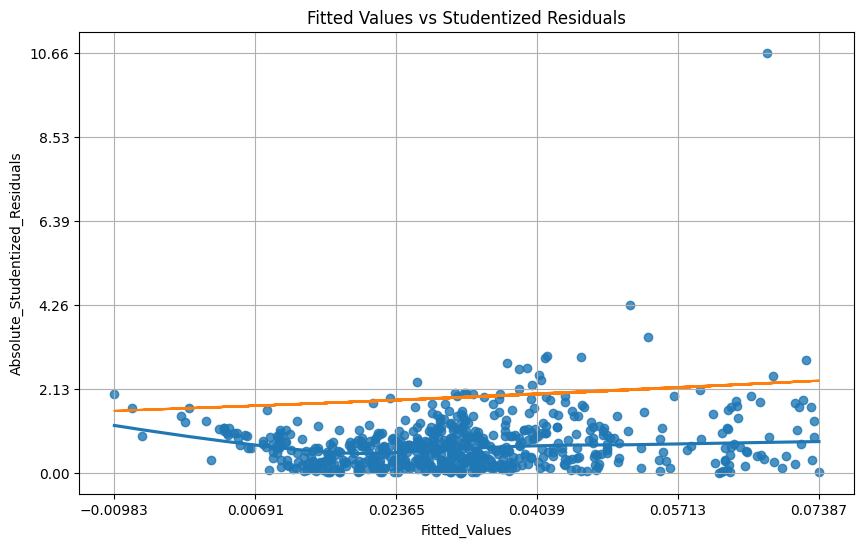

In [66]:
spread_level(results3,Final_data)

In [30]:
# BP test manual

from simple_colors import *

# Heteroskedasticity: Breush-Pagan --> Ho: var = constant
name = ["Lagrange multiplier statistic", "p-value", "f-value", "f p-value"]
test = sms.stats.diagnostic.het_breuschpagan(results3.resid, results3.model.exog)
print(blue("BP Results:",['bold']))
print(list(zip(name, test)))

BP Results:
[('Lagrange multiplier statistic', 74.89743995321669), ('p-value', 5.171513482406615e-13), ('f-value', 10.47358487389872), ('f p-value', 7.8662313546772e-14)]


We observe a p-value less than alpha 0.05 so we reject Ho: and conclude that there is non-constant variance across the sample.

In [31]:
# White Test
import patsy as pt

y, X=pt.dmatrices('crmrte ~ lwsta + lwfed + lprbconv + lpolpc + lwtrd + lprbarr + I(west) + I(central) + I(urban)',
                  Final_data, 
                 return_type='dataframe')
sm.stats.diagnostic.het_white(results3.resid, X)

(359.12089663988905,
 2.444139693368356e-48,
 15.352310058267516,
 5.937473492787155e-77)

In [32]:
# BP test again
sm.stats.diagnostic.het_breuschpagan(results3.resid, X)
# Order is Lm Test statistic, LM P-value, F-stat, F-Pvalue

(76.65132957645014,
 7.453422277742712e-13,
 9.542672113652825,
 1.079409566211207e-13)

Even the above test for heteteroskedasticity shows a p-value > alpha 0.05, indicating non-constant variance. Moving forward we need to change our regression model to account for the non constant variance in an attempt to lower our standard errors and increase our staitistical signficance within the model and by extension the model itself. 

In [23]:
modelf = smf.ols(formula ='crmrte~lwsta+lwfed+lprbconv+lpolpc+lprbarr+I(west)+I(central)+I(urban)',
                data = Final_data)
resultsf = modelf.fit(cov_type='HC1')
print(resultsf.summary())

                            OLS Regression Results                            
Dep. Variable:                 crmrte   R-squared:                       0.735
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     179.9
Date:                Tue, 21 Nov 2023   Prob (F-statistic):          3.50e-156
Time:                        22:05:14   Log-Likelihood:                 2052.0
No. Observations:                 630   AIC:                            -4086.
Df Residuals:                     621   BIC:                            -4046.
Df Model:                           8                                         
Covariance Type:                  HC1                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0662      0.026      2.526      0.0

Our model is shown to have not improved even with heteroskedastic robust standard errors. The standard errors have increased, but we believe that this is the correct way to proceed given the fact that we are dealing with non constant variance. 

#### Test for Model Misspecification

In [67]:
from statsmodels.stats.diagnostic import linear_reset
import statsmodels.stats.outliers_influence as oi

In [68]:
# Ramsey-RESET
X = Final_data[["lwsta","lwfed","lprbconv","lpolpc","lwtrd","lprbarr","west", "central", "urban" ]]
y = Final_data[["crmrte"]]

regression = sm.OLS(y, X)
result = regression.fit(cov_type='HC1')
test = oi.reset_ramsey(result, degree = 2)

print(blue("Ramsey-RESET:",['bold']))
print(test)


Ramsey-RESET:
<F test: F=129.10502770780258, p=2.613731794382106e-27, df_denom=620, df_num=1>


Based on the p-value we reject Ho: and conclude that the model would benefit from higher degree polynomials 

In [74]:
# Note: We can do an added sanity check by estimating two more models: 

#(a) include a quadratic term
print(blue("Quadratic Model",['bold']))
print(smf.ols(formula='crmrte ~ lwsta+lwfed+lprbconv+lpolpc+lprbarr+I(west)+I(central)+I(urban)+ I(lwfed**2)',
        data = Final_data).fit(cov_type = "HC1").summary())

Quadratic Model
                            OLS Regression Results                            
Dep. Variable:                 crmrte   R-squared:                       0.738
Model:                            OLS   Adj. R-squared:                  0.734
Method:                 Least Squares   F-statistic:                     165.4
Date:                Tue, 21 Nov 2023   Prob (F-statistic):          2.14e-158
Time:                        19:13:47   Log-Likelihood:                 2055.2
No. Observations:                 630   AIC:                            -4090.
Df Residuals:                     620   BIC:                            -4046.
Df Model:                           9                                         
Covariance Type:                  HC1                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         1.1366      

We see with the model that the strength has improved slightly, but now we have a multicollinearity problem due to the existence of the federal wage interaction term. It might be best to leave it off all together, especially since it would be difficult to interpret without an effects plot. 

#### Test for the need of interaction terms.

In [79]:
#(b) include an interation term with indicator variables
print(blue("Interaction Model",['bold']))
print(smf.ols(formula='crmrte ~ lwsta+lwfed+lprbconv+lpolpc+lprbarr+I(west)+I(central)+I(urban)+I(urban)*lprbconv',
        data = Final_data).fit(cov_type = "HC1").summary())

Interaction Model
                            OLS Regression Results                            
Dep. Variable:                 crmrte   R-squared:                       0.736
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     160.3
Date:                Tue, 21 Nov 2023   Prob (F-statistic):          1.83e-155
Time:                        19:16:37   Log-Likelihood:                 2053.0
No. Observations:                 630   AIC:                            -4086.
Df Residuals:                     620   BIC:                            -4042.
Df Model:                           9                                         
Covariance Type:                  HC1                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept           

We observe that including an interaction term between the predictors and an indicator variable leads to a statistically insignificant p-value for that interaction term.

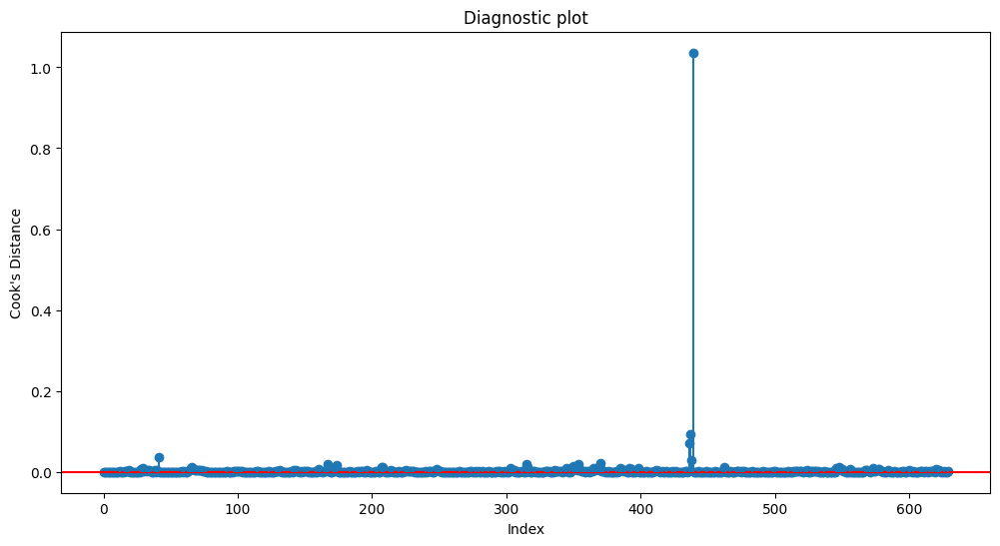

In [37]:
#### Look at Cook's distance Plot, Residuals Plot, QQ-Plot, etc.

model1 = smf.ols(formula = 'crmrte ~ lwsta + lwfed + lprbconv + lpolpc + lprbarr + I(west) + I(central) + I(urban)',
                 data = crime4)
M1_results = model1.fit(cov_type='HC1')

# Cook's distance plot
cooks_distance=M1_results.get_influence().cooks_distance
plt.figure(figsize=(12,6))
plt.scatter(crime4.index,cooks_distance[0])
plt.axhline(0,color='red')
plt.vlines(x=crime4.index, ymin=0,ymax=cooks_distance[0])
plt.xlabel('Index')
plt.ylabel('Cook\'s Distance')
plt.title('Diagnostic plot')
plt.show()

There is a large outlier around the index number of 450. We will not remove this index # for the reasons stated above. 

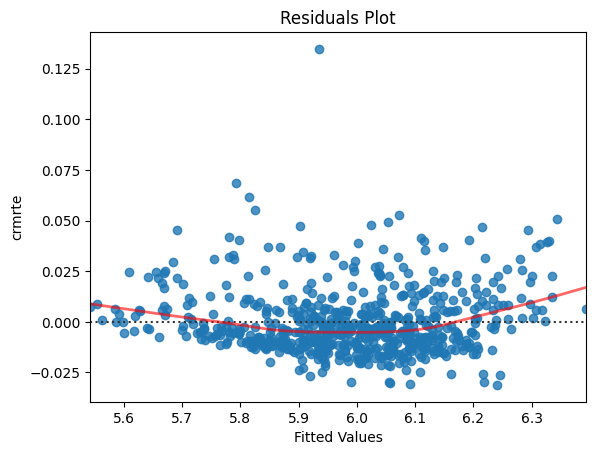

In [38]:
# Plot of residuals
sns.residplot(x='lwfed', y='crmrte', data=crime4,
              lowess=True, line_kws={'color':'red', 'lw':2, 'alpha':0.6})
plt.xlabel('Fitted Values')
plt.title('Residuals Plot')
plt.show()

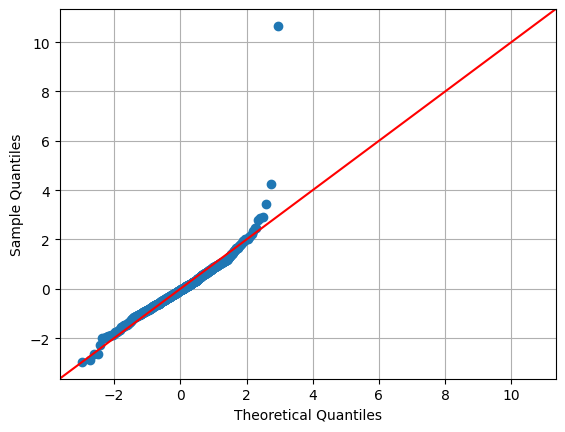

In [39]:
# QQ plot on studentized residuals
student_resid = M1_results.get_influence().resid_studentized
df = len(student_resid)-4
t_dist = stats.t(df)
sm.qqplot(student_resid, line = '45', dist = t_dist)
plt.grid()

We observe some observations that fall outside of the -2:2 boundary. We also observe one extreme datapoint that falls above the sample Quantiles of 10

#### 3. Model Building: Continued 

Use AIC and BIC for model selection.

AIC estimates the quality of the models being considered for the data relative to each other. The smaller the
value of AIC, the better the model.
Similarly to AIC, BIC does the same bu penalizes extra variables more heavily than AIC.
As with AIC, the model with the smallest BIC is preferred.

In [9]:
# AIC model test for model without Indicator variables 
aic_test = results.aic
aic_test

-3803.999594919038

In [10]:
# BIC model test for model without Indicator variables 
bic_test = results.bic
bic_test

-3763.9881165445677

In [16]:
# AIC model test for model with Indicator variables 
aic_test = results1.aic
aic_test

-4085.1437404332646

In [17]:
# BIC model test for model with Indicator variables 
bic_test = results1.bic
bic_test

-4031.7951026006376

In [18]:
# AIC model test for model2 from mallow CP
aic_test2 = results2.aic
aic_test2

-4082.5006569314064

In [19]:
# BIC model test for model2 from mallow CP
bic_test2 = results2.bic
bic_test2

-4033.597738918165

In [20]:
# AIC model test for model3 excluding lwtuc and lwmfg
aic_test3 = results3.aic
aic_test3

-4085.9269973373366

In [21]:
# BIC model test for model3 excluding lwtuc and lwmfg
bic_test3 = results3.bic
bic_test3

-4045.9155189628664

In [24]:
# Heteroskedastic robust model 3 
aic_test3 = resultsf.aic
aic_test3

-4085.9269973373366

In [25]:
# Heteroskedastic robust model 3 
bic_test3 = resultsf.bic
bic_test3

-4045.9155189628664

Our best model is the one which has the lowest AIC and BIC values. In this case it is model 3, but we still want to procede with the heteroskedastic robust model as AIC and BIC values are roughly similar even if it's smaller. 

Evaluate the robustness of your estimates by bootstrapping your model. Provide a histogram of the bootstrapped estimates, and comment on the findings.

In [48]:
# build dataframe to store sample statistics
coefs = pd.DataFrame(columns = ["B0","B1","B2", "B3", "B4", "B5", "B6", "B7", "B8"])

#crmrte ~ lwsta + lwfed + lprbconv + lpolpc + lprbarr + I(west) + I(central) + I(urban)

# we will generate 1000 bootstrap samples
for i in range(1000):
    
    # sample from the data with replacement N times
    sample = Final_data.sample(Final_data.shape[0] ,replace = True)
    
    # fit model on bootstrap sample
    results = smf.ols('crmrte ~ lwsta + lwfed + lprbconv + lpolpc + lprbarr + I(west) + I(central) + I(urban)',
                      sample).fit(cov_type='HC1')
    
    # pull out the bootstrap sample statistics
    b0, b1, b2, b3, b4, b5, b6, b7, b8 = results.params
    
    # store the bootstrap sample statistics for later use
    coefs = coefs._append({"B0":b0, "B1":b1, "B2":b2,"B3":b3,"B4":b4, "B5":b5, "B6":b6, "B7":b7, "B8":b8 },
                         ignore_index = True)

# below I calculate the percentile bootstraps for a 95% confidence interval

# the 97.5 percentile of thebootstrap sample statistics
b0_u, b1_u, b2_u, b3_u, b4_u, b5_u, b6_u, b7_u, b8_u = coefs.quantile(.975)

# the 2.5 percentile of the bootstrap sample statistics
b0_l, b1_l,b2_l, b3_l, b4_l, b5_l, b6_l, b7_l, b8_l = coefs.quantile(.025)

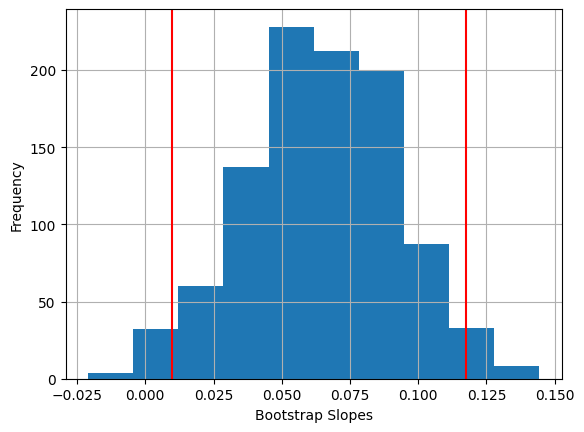

In [49]:
coefs.B0.hist()
plt.xlabel("Bootstrap Slopes")
plt.ylabel("Frequency")
plt.axvline(b0_u, color = "red")
plt.axvline(b0_l, color = "red")
plt.show()

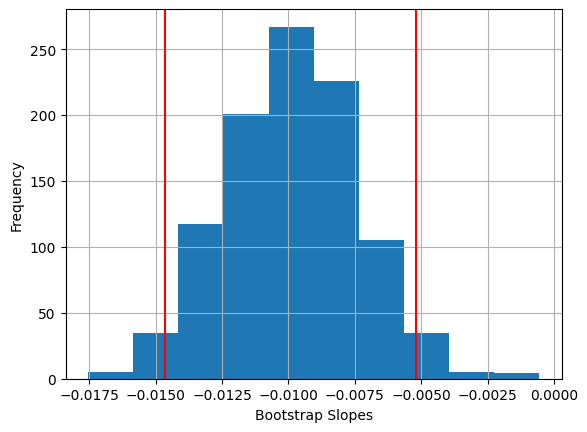

In [50]:
coefs.B1.hist()
plt.xlabel("Bootstrap Slopes")
plt.ylabel("Frequency")
plt.axvline(b1_u, color = "red")
plt.axvline(b1_l, color = "red")
plt.show()

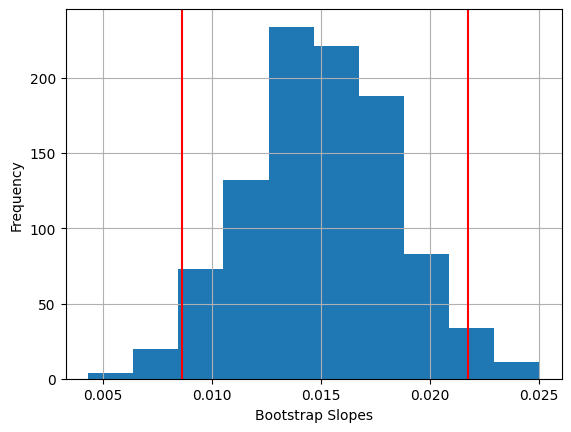

In [51]:
coefs.B2.hist()
plt.xlabel("Bootstrap Slopes")
plt.ylabel("Frequency")
plt.axvline(b2_u, color = "red")
plt.axvline(b2_l, color = "red")
plt.show()

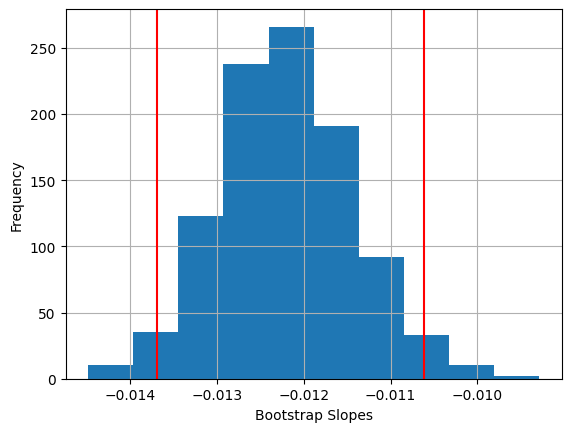

In [52]:
coefs.B3.hist()
plt.xlabel("Bootstrap Slopes")
plt.ylabel("Frequency")
plt.axvline(b3_u, color = "red")
plt.axvline(b3_l, color = "red")
plt.show()

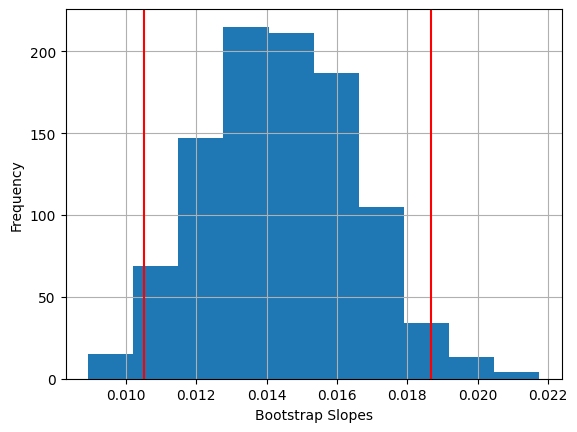

In [53]:
coefs.B4.hist()
plt.xlabel("Bootstrap Slopes")
plt.ylabel("Frequency")
plt.axvline(b4_u, color = "red")
plt.axvline(b4_l, color = "red")
plt.show()

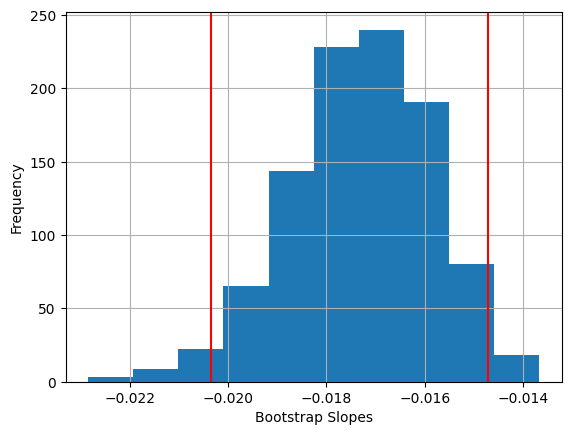

In [54]:
coefs.B5.hist()
plt.xlabel("Bootstrap Slopes")
plt.ylabel("Frequency")
plt.axvline(b5_u, color = "red")
plt.axvline(b5_l, color = "red")
plt.show()

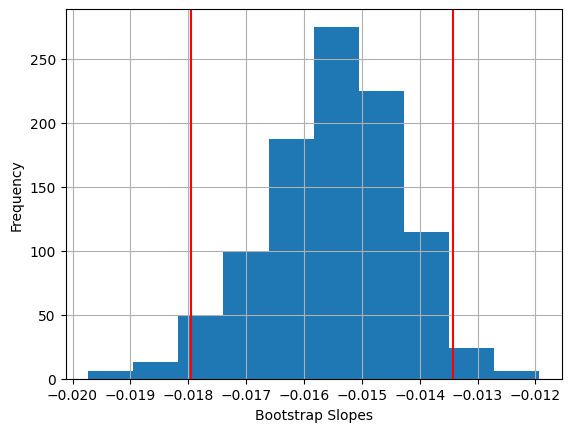

In [55]:
coefs.B6.hist()
plt.xlabel("Bootstrap Slopes")
plt.ylabel("Frequency")
plt.axvline(b6_u, color = "red")
plt.axvline(b6_l, color = "red")
plt.show()

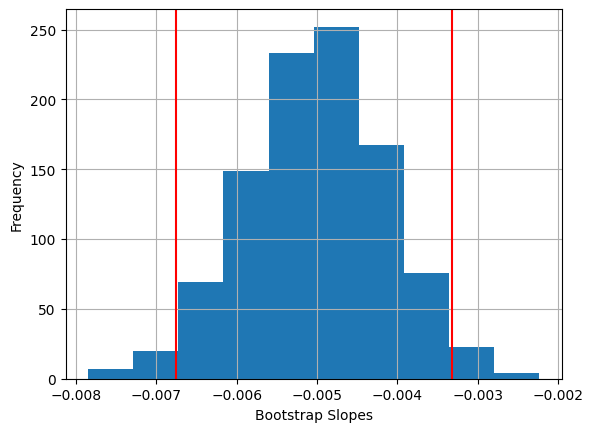

In [56]:
coefs.B7.hist()
plt.xlabel("Bootstrap Slopes")
plt.ylabel("Frequency")
plt.axvline(b7_u, color = "red")
plt.axvline(b7_l, color = "red")
plt.show()

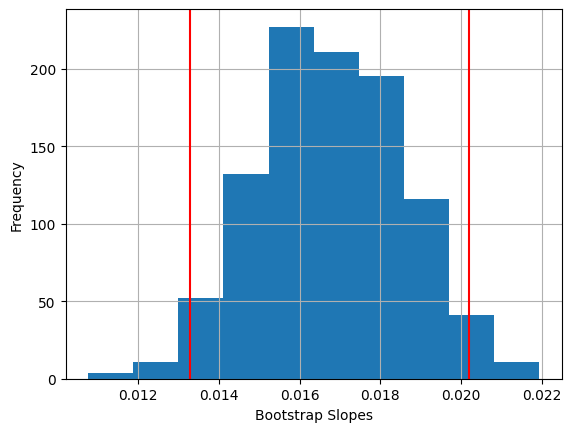

In [57]:
coefs.B8.hist()
plt.xlabel("Bootstrap Slopes")
plt.ylabel("Frequency")
plt.axvline(b8_u, color = "red")
plt.axvline(b8_l, color = "red")
plt.show()

Bootstrapping confirms the strength of the predicted variables and their betas. 

Use cross-validation to evaluate your model’s performance.

In [59]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import cross_val_score

x = Final_data[['lwsta','lwfed','lprbconv','lpolpc','lprbarr','west','central','urban']]
y = Final_data[['crmrte']]
# Perform an OLS fit using all the data
regr = LinearRegression()
model = regr.fit(x,y)
regr.coef_
regr.intercept_

# Split the data into train  (70%)/test(30%) samples:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

# Train the model:
regr = LinearRegression()
regr.fit(x_train, y_train)

# Make predictions based on the test sample
y_pred = regr.predict(x_test)

# Evaluate Performance

print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

# Perform a 5-fold CV
# Use MSE as the scoring function (there are other options as shown here:
# https://scikit-learn.org/stable/modules/model_evaluation.html

regr = linear_model.LinearRegression()
scores = cross_val_score(regr, x, y, cv=5, scoring='neg_root_mean_squared_error')
print('5-Fold CV RMSE Scores:', scores)

MAE: 0.007201033098479308
MSE: 0.00013038555467748025
RMSE: 0.011418649424405684
5-Fold CV RMSE Scores: [-0.00893873 -0.00886363 -0.00981079 -0.01458459 -0.00948581]


From the output we can see that the mean absolute error (MAE) was 0.007201033098479308. That is, the average absolute error between the model prediction and the actual observed data is 0.007201033098479308.
From the output we can see that the root mean squared error (RMSE) was 0.011418649424405682.

In [60]:
#5-fold CV Average
(0.00893873 +0.00886363 +0.00981079 +0.01458459 +0.00948581)/5

0.010336710000000002

The average of the 5-Fold CV RSME is 0.010336710000000002, which is close to RSME 0.011418649424405682

In [61]:
Final_data.describe()

,crmrte,lwtuc,lwsta,lwfed,lprbconv,lpolpc,lwtrd,lwmfg,lprbarr,west,central,urban,intercept
count,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,630.000000,6.300000e+02
mean,0.031588,5.915883,5.677787,5.988757,-0.692919,-6.490637,5.232423,5.615181,-1.274264,0.233333,0.377778,0.088889,6.200000e-02
std,0.018121,0.370219,0.176131,0.158761,0.609595,0.526654,0.214391,0.272747,0.415897,0.423289,0.485217,0.284809,5.555526e-17
min,0.001812,3.362377,5.153407,5.542831,-2.682732,-7.687507,2.825760,4.623305,-2.833214,0.000000,0.000000,0.000000,6.200000e-02
25%,0.018352,5.760787,5.553570,5.890330,-1.056438,-6.732704,5.124259,5.455449,-1.523711,0.000000,0.000000,0.000000,6.200000e-02
50%,0.028441,5.881098,5.667706,6.001365,-0.745758,-6.535785,5.222935,5.604312,-1.279271,0.000000,0.000000,0.000000,6.200000e-02
75%,0.038406,6.018639,5.803605,6.097062,-0.453193,-6.318168,5.322137,5.768172,-1.042653,0.000000,1.000000,0.000000,6.200000e-02
max,0.163835,8.020257,6.306275,6.393507,3.610918,-3.336024,7.715457,6.472115,1.011601,1.000000,1.000000,1.000000,6.200000e-02


Our estimations are actually pretty robust. The crimerate mean is around 0.032, with a standard devation of around 0.018 and a median of 0.028. Our average prediction is off by 0.011 crimes per person which is within the standard deviation and the interquartile ranges. 

It's still 1/3rd of the mean though so maybe we can improve the model somewhat, if we rmoved outliers which we talked about above. Per 100 people we assign an extra crime. If we imagine a city of 100,000 we assign them an extra 1,100 crimes. Looking at the model in terms of this that's quite a bit in terms of real life numbers. So maybe overall we shouldn't take policy implications from the model. 

#### Printout of model marginal effects

In [10]:
# Get the marginal effects
mod4 = smf.ols('crmrte~lwsta+lwfed+lprbconv+lpolpc+lprbarr+C(west)+C(central)+C(urban)', data = Final_data).fit(cov_type='HC1')

print(mod4.summary2().tables[1].iloc[:, :-2].round(4))

                  Coef.  Std.Err.        z   P>|z|
Intercept        0.0662    0.0262   2.5263  0.0115
C(west)[T.1]    -0.0156    0.0012 -13.2807  0.0000
C(central)[T.1] -0.0050    0.0009  -5.5291  0.0000
C(urban)[T.1]    0.0167    0.0018   9.3755  0.0000
lwsta           -0.0098    0.0025  -3.9760  0.0001
lwfed            0.0148    0.0032   4.5879  0.0000
lprbconv        -0.0122    0.0008 -16.1591  0.0000
lpolpc           0.0145    0.0021   6.8022  0.0000
lprbarr         -0.0174    0.0014 -12.3147  0.0000


For the independent variables, the negative values mean that our dependent variable crmrte decreases with an increases in these independent variables. Our binary variales west and central have negative coefficients which can be interpreted as; if west is 1 with a coef of -0.0156, crmrte is -0.0156 lower  in the west compared to non-west locations, keeping all other variables constant. For the binary variable urban, if it is 1 with a coef of 0.0167 - this means crmrte is 0.0167 higher in urban areas than non-urban locations, keeping all other variables constant.

In [9]:
# Second method for getting the marginal effects
marg_model = smf.ols('crmrte~lwsta+lwfed+lprbconv+lpolpc+lprbarr+I(west)+I(central)+I(urban)',
               data = Final_data).fit(cov_type='HC1')
marg_model.params

Intercept     0.066173
lwsta        -0.009784
lwfed         0.014833
lprbconv     -0.012165
lpolpc        0.014539
lprbarr      -0.017370
I(west)      -0.015617
I(central)   -0.005025
I(urban)      0.016717
dtype: float64

If you identify any model issues (e.g., multicollinearity, etc.) make sure to resolve them before finalizing your proposed model.

##### Our final model is; 
##### model3 = smf.ols(formula ='crmrte~lwsta+lwfed+lprbconv+lpolpc+lprbarr+I(west)+I(central)+I(urban)',data = Final_data)

Interaction and quadratic terms: We observed that the results from our model misspecification stated that the model could benefit from including higher order terms. We ran a test on these results and found that the improvements were so minimal. We also included an interaction term but there was no major improvement to the model and the interaction term came out statistically insignificant.

Once you have finalized your model, please provide an interpretation of your model parameters, and any economic insights you learned from it (this includes answering the questions you proposed in the introduction).

#### Conclusion

After choosing the final model, we can now interpret the coefficients and evaluate economic significance. A 1% increase in each log variable corresponds to a $\frac{{\beta}_k}{100}$ change in crime rate, so we can see that the strongest correlated independent variable with crime rate is the log of the probability of arrest. Further, a 1% increase in the log of the probability of conviction results in a $\frac{-0.0174}{100}=-0.00174$ decrease in the crime rate per person, which in the hypothetical city above, is a significant drop. This would mean -0.00174*100000 people = -174, which means that there are 174 less crimes, and the city is safer.

Overall, the Jarque-Bera value is greater than 8000, which is very large, but that is to be expected with real-world data. It is important to note that an increase in wages in federal industries increases the overall crime rate, but the opposite is true in state industries. There is no data in our regression results to explain this, so we acknowledge that there are likely exogenous factors at play here.